In [28]:
import numpy as np
import matplotlib.pyplot as plt
import imageio
import os
import torch
import cv2
import pandas as pd
import numpy as np
import os
import pydicom
import matplotlib.pyplot as plt
from skimage.io import imread
import seaborn as sns
from glob import glob
import ipywidgets as widgets
import scipy.ndimage as ndimage
import imageio
from skimage.segmentation import clear_border
from skimage import measure
from skimage.measure import label,regionprops
from scipy import ndimage as ndi
from scipy.ndimage import measurements, center_of_mass, binary_dilation, zoom
import plotly.graph_objects as go
import keyboard
import torch
import torchvision
print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("CUDA is available:", torch.cuda.is_available())
import sys

PyTorch version: 2.0.1
Torchvision version: 0.15.2
CUDA is available: False


In [2]:
# !{sys.executable} -m pip install opencv-python matplotlib
# !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'

In [3]:
import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamPredictor

sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cpu"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor = SamPredictor(sam)

In [4]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))    

In [5]:
# Labael Meaning

# AD -- 0
# CN -- 1
# MCI -- 2

In [6]:
def volumetric_segmentation_sam(vol_images, mask_plot, logits_plot, ref_point=0):
    num_selected_slices = 0
    masked_vol_images = []
    mask_vol = []
    logits_vol = []

    print("In this process, segmented anything model are used to segment and to get rid of the noise from the images.")


    for slice_num in range(len(vol_images)-ref_point):

        if num_selected_slices < 32:
            
            slice_num = slice_num + ref_point

            plt.close()
            # Vol data should be np.array in this function
            print(f"slice number of the images is {slice_num}.")

            slice_img = vol_images[slice_num,:,:,:]
            plt.imshow(slice_img)
            plt.title("Original Images")
            plt.show()


            image_for_mask = (slice_img * 255).round().astype(np.uint8) # 8 bit image type is import an to predict to desired masking

            predictor.set_image(image_for_mask)

            input_point = np.array([[128, 155]])
            input_label = np.array([1])

            masks, scores, logits = predictor.predict(
                point_coords=input_point,
                point_labels=input_label,
                multimask_output=True,)
            

            if logits_plot == True:
                plt.subplot(1,3,1)
                plt.imshow(logits[0,:,:])
                plt.title("Prediction Logits 0")
                plt.subplot(1,3,2)
                plt.imshow(logits[1,:,:])
                plt.title("Prediction Logits 1")
                plt.subplot(1,3,3)
                plt.imshow(logits[2,:,:])
                plt.title("Prediction Logits 2")
                plt.show()


            if mask_plot == True:
                plt.subplot(1,3,1)
                plt.imshow(masks[0,:,:]) # True or False values are  determined
                plt.title("Prediction Mask 0")
                plt.subplot(1,3,2)
                plt.imshow(masks[1,:,:])
                plt.title("Prediction Mask 1")
                plt.subplot(1,3,3)
                plt.imshow(masks[2,:,:])
                plt.title("Prediction Mask 2")
                plt.show()

            
            masked_image = np.ones(slice_img.shape)
            masked_image.shape
            masked_image[:,:,0] = slice_img[:,:,0] * masks[0,:,:] 
            masked_image[:,:,1] = slice_img[:,:,1] * masks[0,:,:] 
            masked_image[:,:,2] = slice_img[:,:,2] * masks[0,:,:] 

            masked_image1 = np.ones(slice_img.shape)
            masked_image1.shape
            masked_image1[:,:,0] = slice_img[:,:,0] * masks[1,:,:] 
            masked_image1[:,:,1] = slice_img[:,:,1] * masks[1,:,:] 
            masked_image1[:,:,2] = slice_img[:,:,2] * masks[1,:,:]

            masked_image2 = np.ones(slice_img.shape)
            masked_image2.shape
            masked_image2[:,:,0] = slice_img[:,:,0] * masks[2,:,:]
            masked_image2[:,:,1] = slice_img[:,:,1] * masks[2,:,:] 
            masked_image2[:,:,2] = slice_img[:,:,2] * masks[2,:,:] 


            plt.figure(figsize=(10,10))
            plt.subplot(1,3,1)
            plt.imshow(masked_image[:,:,:]) # True or False values are  determined
            plt.title("Masked Images 0")
            plt.subplot(1,3,2)
            plt.imshow(masked_image1[:,:,:])
            plt.title("Masked Images 1")
            plt.subplot(1,3,3)
            plt.imshow(masked_image2[:,:,:])
            plt.title("Masked Images 2")
            plt.show()

            
            process = True
            while process == True:
            
                okey = input("Do you want this slice to be included for your new dataset? [y/n]")
                if okey == "y":

                    num_selected_slices = 1 + num_selected_slices
                    condition = True
                    while condition:
                        better = input("Whic msked images are better ?")
                        
                        if better == "0":
                            masked_vol_images.append(masked_image)
                            mask_vol.append(masks[0,:,:])
                            logits_vol.append(logits[0,:,:])
                            condition = False
                        elif better == "1":
                            masked_vol_images.append(masked_image1)
                            mask_vol.append(masks[1,:,:])
                            logits_vol.append(logits[1,:,:])
                            condition = False
                        elif better == "2":
                            masked_vol_images.append(masked_image2)
                            mask_vol.append(masks[2,:,:])
                            logits_vol.append(logits[2,:,:])
                            condition = False
                        else:
                            print("Hacı Yanlış Sayı Girdin Tekrar Dene")
                            condition = True 

                    print(f"Number of selected slices is {num_selected_slices}")
                    process = False
                elif okey == "n":
                    print("Selected slicess are removed your dataset.")
                    process = False
                else:
                    print("Write again your answer with only using y or n key for your process")
            
        elif num_selected_slices == 32:
            break
            
    print("###############################################################")

    selected = False

    while selected != True:
        which_one = input("If you want the extra logits and masks volumetric datas, you should write 1 or not only 0 are enough.")

        if which_one == "0":
            result = np.array(masked_vol_images)
            selected = True
        elif which_one == "1":
            result =  (np.array(masked_vol_images), np.array(logits_vol), np.array(mask_vol))
            selected = True
        else:
            print("Only you can write 0 or 1")


    return result

        

        

Train Dataset Segmented

In [129]:
### Thiss Class only includes MCI conditions patients dataset and training of our approach

X_train_13 = np.load("/Volumes/IKBAL/Temiz_dataset/X_train__5.npy")
print(X_train_13.shape)

X_train_13 = np.load("/Volumes/IKBAL/Temiz_dataset/X_train__5.npy")
print(X_train_13.shape)



# This is segmented and saved as. MCI_masked_vol_images_300.npy, And ve reversed this vol images.
vol_images_300 = X_train_13[0,:,:,:,:]
vol_images_300.shape

# This is segmented and saved as. MCI_masked_vol_images_301.npy
vol_images_301 = X_train_13[1,:,:,:,:]
vol_images_301.shape

# This is segmented and saved as. MCI_masked_vol_images_302.npy, And ve reversed this vol images.
vol_images_302 = X_train_13[2,:,:,:,:]
vol_images_302.shape

# This is segmented and saved as. MCI_masked_vol_images_303.npy, And ve reversed this vol images.
vol_images_303 = X_train_13[3,:,:,:,:]
vol_images_303.shape

# This is segmented and saved as. MCI_masked_vol_images_304.npy, And ve reversed this vol images.
vol_images_304 = X_train_13[4,:,:,:,:]
vol_images_304.shape

# This is segmented and saved as. MCI_masked_vol_images_305.npy, And ve reversed this vol images.
vol_images_305 = X_train_13[5,:,:,:,:]
vol_images_305.shape

# This is segmented and saved as. MCI_masked_vol_images_306.npy, And ve reversed this vol images.
# vol_images_306 = X_train_13[6,:,:,:,:]
# vol_images_306.shape

# This is segmented and saved as. MCI_masked_vol_images_307.npy, And ve reversed this vol images.
# vol_images_307 = X_train_13[7,:,:,:,:]
# vol_images_307.shape

# This is segmented and saved as. MCI_masked_vol_images_308.npy, And ve reversed this vol images.
# vol_images_308 = X_train_13[8,:,:,:,:]
# vol_images_308.shape

# This is segmented and saved as. MCI_masked_vol_images_309.npy, And ve reversed this vol images.
# vol_images_309 = X_train_13[9,:,:,:,:]
# vol_images_309.shape

# This is segmented and saved as. MCI_masked_vol_images_310.npy
# vol_images_310 = X_train_13[10,:,:,:,:]
# vol_images_310.shape

# This is segmented and saved as. MCI_masked_vol_images_311.npy
# vol_images_311 = X_train_13[11,:,:,:,:]
# vol_images_311.shape

# This is segmented and saved as. MCI_masked_vol_images_312.npy
# vol_images_312 = X_train_13[12,:,:,:,:]
# vol_images_312.shape

# This is segmented and saved as. MCI_masked_vol_images_313.npy
# vol_images_313 = X_train_13[13,:,:,:,:]
# vol_images_313.shape

# This is segmented and saved as. MCI_masked_vol_images_314.npy
# vol_images_314 = X_train_13[14,:,:,:,:]
# vol_images_314.shape

# This volumetric dataset is removed because it is very danger for segmenttion
# vol_images_315 = X_train_13[15,:,:,:,:]
# vol_images_315.shape

# This is segmented and saved as. MCI_masked_vol_images_316.npy
# vol_images_316 = X_train_13[16,:,:,:,:]
# vol_images_316.shape

# This is segmented and saved as. MCI_masked_vol_images_317.npy
# vol_images_317 = X_train_13[17,:,:,:,:]
# vol_images_317.shape

# This is segmented and saved as. MCI_masked_vol_images_318.npy, And ve reversed this vol images.
# vol_images_318 = X_train_13[18,:,:,:,:]
# vol_images_318.shape

# This is segmented and saved as. MCI_masked_vol_images_320.npy
# vol_images_319 = X_train_13[19,:,:,:,:]
# vol_images_319.shape

# This is segmented and saved as. MCI_masked_vol_images_321.npy
# vol_images_320 = X_train_13[20,:,:,:,:]
# vol_images_320.shape

# This is segmented and saved as. MCI_masked_vol_images_321.npy, And ve reversed this vol images.
# vol_images_321 = X_train_13[21,:,:,:,:]
# vol_images_321.shape

# This is segmented and saved as. MCI_masked_vol_images_321.npy, And ve reversed this vol images.
# vol_images_322 = X_train_13[22,:,:,:,:]
# vol_images_322.shape

# This volumetric dataset is removed because it is very danger for segmenttion
# vol_images_323 = X_train_13[23,:,:,:,:]
# vol_images_323.shape

# This is segmented and saved as. MCI_masked_vol_images_321.npy, And ve reversed this vol images.
# vol_images_324 = X_train_13[24,:,:,:,:]
# vol_images_324.shape

(25, 58, 256, 256, 3)
(25, 58, 256, 256, 3)


(58, 256, 256, 3)

In [59]:
### Thiss Class only includes CN conditions patients dataset and training of our approach

X_train_5 = np.load("/Volumes/IKBAL/Temiz_dataset/X_train__5.npy")
print(X_train_5.shape)

X_train_5 = np.load("/Volumes/IKBAL/Temiz_dataset/X_train__5.npy")
print(X_train_5.shape)



# This is segmented and saved as. CN_masked_vol_images_100.npy
vol_images_100 = X_train_5[0,:,:,:,:]
vol_images_100.shape

# This is segmented and saved as. CN_masked_vol_images_101.npy
vol_images_101 = X_train_5[1,:,:,:,:]
vol_images_101.shape

# This is segmented and saved as. CN_masked_vol_images_102.npy
vol_images_102 = X_train_5[2,:,:,:,:]
vol_images_102.shape

# This is segmented and saved as. CN_masked_vol_images_103.npy
vol_images_103 = X_train_5[3,:,:,:,:]
vol_images_103.shape

# This is segmented and saved as. CN_masked_vol_images_104.npy
vol_images_104 = X_train_5[4,:,:,:,:]
vol_images_104.shape

# This is segmented and saved as. CN_masked_vol_images_105.npy
vol_images_105 = X_train_5[5,:,:,:,:]
vol_images_105.shape

# This is segmented and saved as. CN_masked_vol_images_105.npy,  And ve reversed this vol images.
vol_images_106 = X_train_5[6,:,:,:,:]
vol_images_106.shape

# This is segmented and saved as. CN_masked_vol_images_107.npy
vol_images_107 = X_train_5[7,:,:,:,:]
vol_images_107.shape

# This is segmented and saved as. CN_masked_vol_images_108.npy
vol_images_108 = X_train_5[8,:,:,:,:]
vol_images_108.shape

# This is segmented and saved as. CN_masked_vol_images_108.npy
vol_images_109 = X_train_5[9,:,:,:,:]
vol_images_109.shape

# This is segmented and saved as. CN_masked_vol_images_110.npy,  And ve reversed this vol images.
vol_images_110 = X_train_5[10,:,:,:,:]
vol_images_110.shape

# This is segmented and saved as. CN_masked_vol_images_111.npy,  And ve reversed this vol images.
# vol_images_111 = X_train_5[11,:,:,:,:]
# vol_images_111.shape

# This is segmented and saved as. CN_masked_vol_images_112.npy,  And ve reversed this vol images.
# vol_images_112 = X_train_5[12,:,:,:,:]
# vol_images_112.shape

# This is segmented and saved as. CN_masked_vol_images_113.npy,  And ve reversed this vol images.
# vol_images_113 = X_train_5[13,:,:,:,:]
# vol_images_113.shape

# This is segmented and saved as. CN_masked_vol_images_114.npy,  And ve reversed this vol images.
# vol_images_114 = X_train_5[14,:,:,:,:]
# vol_images_114.shape

# This is segmented and saved as. CN_masked_vol_images_115.npy,  And ve reversed this vol images.
# vol_images_115 = X_train_5[15,:,:,:,:]
# vol_images_115.shape

# This is segmented and saved as. CN_masked_vol_images_116.npy,  And ve reversed this vol images.
# vol_images_116 = X_train_5[16,:,:,:,:]
# vol_images_116.shape

# This is segmented and saved as. CN_masked_vol_images_117.npy,  And ve reversed this vol images.
# vol_images_117 = X_train_5[17,:,:,:,:]
# vol_images_117.shape

# This is segmented and saved as. CN_masked_vol_images_118.npy,  And ve reversed this vol images.
# vol_images_118 = X_train_5[18,:,:,:,:]
# vol_images_118.shape

# This is segmented and saved as. CN_masked_vol_images_119.npy,  And ve reversed this vol images.
# vol_images_119 = X_train_5[19,:,:,:,:]
# vol_images_119.shape

####################### This volumetric images i don't preferr so that i remove our dataset #######################
# vol_images_120 = X_train_5[20,:,:,:,:]
# vol_images_120.shape

# This is segmented and saved as. CN_masked_vol_images_121.npy,  And ve reversed this vol images.
# vol_images_121 = X_train_5[21,:,:,:,:]
# vol_images_121.shape

# This is segmented and saved as. CN_masked_vol_images_122.npy
# vol_images_122 = X_train_5[22,:,:,:,:]
# vol_images_122.shape

# This is segmented and saved as. CN_masked_vol_images_123.npy
# vol_images_123 = X_train_5[23,:,:,:,:]
# vol_images_123.shape

# This is segmented and saved as. CN_masked_vol_images_124.npy,  And ve reversed this vol images.
# vol_images_124 = X_train_5[24,:,:,:,:]
# vol_images_124.shape

(25, 58, 256, 256, 3)
(25, 58, 256, 256, 3)


(58, 256, 256, 3)

In [58]:
### Thiss Class only includes AD patients dataset and training of our approach

X_train_1 = np.load("/Volumes/IKBAL/Temiz_dataset/X_train__1.npy")
print(X_train_1.shape)

Y_train_1 = np.load("/Volumes/IKBAL/Temiz_dataset/Y_train__1.npy")
print(Y_train_1.shape)



# This is segmented and saved as. AD_masked_vol_images_0.npy
vol_images_0 = X_train_1[0,:,:,:,:]
vol_images_0.shape

# This is segmented and saved as. AD_masked_vol_images_1.npy
vol_images_1 = X_train_1[1,:,:,:,:]
vol_images_1.shape

# This is segmented and saved as. AD_masked_vol_images_2.npy
vol_images_2 = X_train_1[2,:,:,:,:]
vol_images_2.shape

# This is segmented and saved as. AD_masked_vol_images_3.npy
vol_images_3 = X_train_1[3,:,:,:,:]
vol_images_3.shape

# This is segmented and saved as. AD_masked_vol_images_4.npy
vol_images_4 = X_train_1[4,:,:,:,:]
vol_images_4.shape

# This is segmented and saved as. AD_masked_vol_images_5.npy
vol_images_5 = X_train_1[5,:,:,:,:]
vol_images_5.shape

####################### This volumetric images i don't preferr so that i remove our dataset #######################
# vol_images_6 = X_train_1[6,:,:,:,:]
# vol_images_6.shape

# This is segmented and saved as. AD_masked_vol_images_7.npy,  And ve reversed this vol images
vol_images_7 = X_train_1[7,:,:,:,:]
vol_images_7.shape

# This is segmented and saved as. AD_masked_vol_images_8.npy,  And ve reversed this vol images
vol_images_8 = X_train_1[8,:,:,:,:]
vol_images_8.shape

# This is segmented and saved as. AD_masked_vol_images_9.npy,  And ve reversed this vol images
vol_images_9 = X_train_1[9,:,:,:,:]
vol_images_9.shape

# This is segmented and saved as. AD_masked_vol_images_10.npy,  And ve reversed this vol images
vol_images_10 = X_train_1[10,:,:,:,:]
vol_images_10.shape

# This is segmented and saved as. AD_masked_vol_images_11.npy,  And ve reversed this vol images
# vol_images_11 = X_train_1[11,:,:,:,:]
# vol_images_11.shape

# This is segmented and saved as. AD_masked_vol_images_12.npy,  And ve reversed this vol images
# vol_images_12 = X_train_1[12,:,:,:,:]
# vol_images_12.shape

# This is segmented and saved as. AD_masked_vol_images_13.npy,  And ve reversed this vol images
# vol_images_13 = X_train_1[13,:,:,:,:]
# vol_images_13.shape

# This is segmented and saved as. AD_masked_vol_images_14.npy,  And ve reversed this vol images
# vol_images_14 = X_train_1[14,:,:,:,:]
# vol_images_14.shape

# This is segmented and saved as. AD_masked_vol_images_15.npy
# vol_images_15 = X_train_1[15,:,:,:,:]
# vol_images_15.shape

# This is segmented and saved as. AD_masked_vol_images_16.npy
# vol_images_16 = X_train_1[16,:,:,:,:]
# vol_images_16.shape

# This is segmented and saved as. AD_masked_vol_images_17.npy
# vol_images_17 = X_train_1[17,:,:,:,:]
# vol_images_17.shape

# This is segmented and saved as. AD_masked_vol_images_18.npy
# vol_images_18 = X_train_1[18,:,:,:,:]
# vol_images_18.shape

# This is segmented and saved as. AD_masked_vol_images_19.npy
# vol_images_19 = X_train_1[19,:,:,:,:]
# vol_images_19.shape

# This is segmented and saved as. AD_masked_vol_images_20.npy
# vol_images_20 = X_train_1[20,:,:,:,:]
# vol_images_20.shape

####################### This volumetric images i don't preferr so that i remove our dataset #######################
# vol_images_21 = X_train_1[21,:,:,:,:]
# vol_images_21.shape

# This is segmented and saved as. AD_masked_vol_images_22.npy,  And ve reversed this vol images
# vol_images_22 = X_train_1[22,:,:,:,:]
# vol_images_22.shape


# This is segmented and saved as. AD_masked_vol_images_23.npy,  And ve reversed this vol images
# vol_images_23 = X_train_1[23,:,:,:,:]
# vol_images_23.shape

# This is segmented and saved as. AD_masked_vol_images_24.npy,  And ve reversed this vol images
# vol_images_24 = X_train_1[24,:,:,:,:]
# vol_images_24.shape

(25, 58, 256, 256, 3)
(25,)


(58, 256, 256, 3)

Test Dataset Segmented 

In [10]:
X_test_1 = np.load("/Volumes/IKBAL/Temiz_dataset/X_test__1.npy")
print(X_test_1.shape)

Y_test_1 = np.load("/Volumes/IKBAL/Temiz_dataset/Y_test__1.npy")
print(Y_test_1.shape)

(25, 58, 256, 256, 3)
(25,)


In [11]:
### Thiss Class only includes AD patients dataset and training of our approach for testdataset


X_test_1 = np.load("/Volumes/IKBAL/Temiz_dataset/X_test__1.npy")
print(X_test_1.shape)

Y_test_1 = np.load("/Volumes/IKBAL/Temiz_dataset/Y_test__1.npy")
print(Y_test_1.shape)



# This is segmented and saved as. AD_masked_vol_images_0.npy in test dataset,  And ve reversed this vol images
# vol_images_0 = X_test_1[0,:,:,:,:]
# vol_images_0.shape

# This is segmented and saved as. AD_masked_vol_images_1.npy in test dataset,  And ve reversed this vol images
# vol_images_1 = X_test_1[1,:,:,:,:]
# vol_images_1.shape

####################### This volumetric images i don't preferr so that i remove our dataset #######################
# vol_images_2 = X_test_1[2,:,:,:,:]
# vol_images_2.shape

# This is segmented and saved as. AD_masked_vol_images_3.npy in test dataset,  And ve reversed this vol images
# vol_images_3 = X_test_1[3,:,:,:,:]
# vol_images_3.shape

# This is segmented and saved as. AD_masked_vol_images_4.npy in test dataset,  And ve reversed this vol images
# vol_images_4 = X_test_1[4,:,:,:,:]
# vol_images_4.shape

# This is segmented and saved as. AD_masked_vol_images_5.npy in test dataset,  And ve reversed this vol images
# vol_images_5 = X_test_1[5,:,:,:,:]
# vol_images_5.shape

# This is segmented and saved as. AD_masked_vol_images_6.npy in test dataset,  And ve reversed this vol images
# vol_images_6 = X_test_1[6,:,:,:,:]
# vol_images_6.shape

# This is segmented and saved as. AD_masked_vol_images_7.npy in test dataset,  And ve reversed this vol images
# vol_images_7 = X_test_1[7,:,:,:,:]
# vol_images_7.shape

# This is segmented and saved as. AD_masked_vol_images_8.npy in test dataset. 
# vol_images_8 = X_test_1[8,:,:,:,:]
# vol_images_8.shape

# This is segmented and saved as. AD_masked_vol_images_9.npy in test dataset. 
# vol_images_9 = X_test_1[9,:,:,:,:]
# vol_images_9.shape

# This is segmented and saved as. AD_masked_vol_images_9.npy in test dataset. 
# vol_images_10 = X_test_1[10,:,:,:,:]
# vol_images_10.shape

vol_images_11 = X_test_1[11,:,:,:,:]
vol_images_11.shape

vol_images_12 = X_test_1[12,:,:,:,:]
vol_images_12.shape

vol_images_13 = X_test_1[13,:,:,:,:]
vol_images_13.shape

vol_images_14 = X_test_1[14,:,:,:,:]
vol_images_14.shape

vol_images_15 = X_test_1[15,:,:,:,:]
vol_images_15.shape

vol_images_16 = X_test_1[16,:,:,:,:]
vol_images_16.shape

vol_images_17 = X_test_1[17,:,:,:,:]
vol_images_17.shape

vol_images_18 = X_test_1[18,:,:,:,:]
vol_images_18.shape

vol_images_19 = X_test_1[19,:,:,:,:]
vol_images_19.shape

vol_images_20 = X_test_1[20,:,:,:,:]
vol_images_20.shape

vol_images_21 = X_test_1[21,:,:,:,:]
vol_images_21.shape

vol_images_22 = X_test_1[22,:,:,:,:]
vol_images_22.shape

vol_images_23 = X_test_1[23,:,:,:,:]
vol_images_23.shape

vol_images_24 = X_test_1[24,:,:,:,:]
vol_images_24.shape

(25, 58, 256, 256, 3)
(25,)


(58, 256, 256, 3)

In [12]:
X_test_3 = np.load("/Volumes/IKBAL/Temiz_dataset/X_test__3.npy")
print(X_test_3.shape)

Y_test_3 = np.load("/Volumes/IKBAL/Temiz_dataset/Y_test__3.npy")
print(Y_test_3.shape)

(25, 58, 256, 256, 3)
(25,)


In [13]:
##Thiss Class only includes CN conditions patients dataset and training of our approach

# This is segmented and saved as. CN_masked_vol_images_50.npy in test dataset,  And ve reversed this vol images
# vol_images_50 = X_test_3[0,:,:,:,:]
# vol_images_50.shape

# This is segmented and saved as. CN_masked_vol_images_51.npy in test dataset.
# vol_images_51 = X_test_3[1,:,:,:,:]
# vol_images_51.shape

# This is segmented and saved as. CN_masked_vol_images_52.npy in test dataset,  And ve reversed this vol images
# vol_images_52 = X_test_3[2,:,:,:,:]
# vol_images_52.shape

# This is segmented and saved as. CN_masked_vol_images_53.npy in test dataset,  And ve reversed this vol images
# vol_images_53 = X_test_3[3,:,:,:,:]
# vol_images_53.shape

# This is segmented and saved as. CN_masked_vol_images_54.npy in test dataset,  And ve reversed this vol images
# vol_images_54 = X_test_3[4,:,:,:,:]
# vol_images_54.shape

# This is segmented and saved as. CN_masked_vol_images_55.npy in test dataset,  And ve reversed this vol images
# vol_images_55 = X_test_3[5,:,:,:,:]
# vol_images_55.shape

# This is segmented and saved as. CN_masked_vol_images_56.npy in test dataset,  And ve reversed this vol images
# vol_images_56 = X_test_3[6,:,:,:,:]
# vol_images_56.shape

# This is segmented and saved as. CN_masked_vol_images_57.npy in test dataset,  And ve reversed this vol images
# vol_images_57 = X_test_3[7,:,:,:,:]
# vol_images_57.shape

# This is segmented and saved as. CN_masked_vol_images_58.npy in test dataset,  And ve reversed this vol images
# vol_images_58 = X_test_3[8,:,:,:,:]
# vol_images_58.shape

# This is segmented and saved as. CN_masked_vol_images_59.npy in test dataset,  And ve reversed this vol images
# vol_images_59 = X_test_3[9,:,:,:,:]
# vol_images_59.shape

vol_images_60 = X_test_3[10,:,:,:,:]
vol_images_60.shape

vol_images_61 = X_test_3[11,:,:,:,:]
vol_images_61.shape

vol_images_62 = X_test_3[12,:,:,:,:]
vol_images_62.shape

vol_images_63 = X_test_3[13,:,:,:,:]
vol_images_63.shape

vol_images_64 = X_test_3[14,:,:,:,:]
vol_images_64.shape

vol_images_65 = X_test_3[15,:,:,:,:]
vol_images_65.shape

vol_images_66 = X_test_3[16,:,:,:,:]
vol_images_66.shape

vol_images_67 = X_test_3[17,:,:,:,:]
vol_images_67.shape

vol_images_68 = X_test_3[18,:,:,:,:]
vol_images_68.shape

vol_images_69 = X_test_3[19,:,:,:,:]
vol_images_69.shape

vol_images_70 = X_test_3[20,:,:,:,:]
vol_images_70.shape

vol_images_71 = X_test_3[21,:,:,:,:]
vol_images_71.shape

vol_images_72 = X_test_3[22,:,:,:,:]
vol_images_72.shape

vol_images_73 = X_test_3[23,:,:,:,:]
vol_images_73.shape

vol_images_74 = X_test_3[24,:,:,:,:]
vol_images_74.shape

(58, 256, 256, 3)

In [14]:
X_test_5 = np.load("/Volumes/IKBAL/Temiz_dataset/X_test__5.npy")
print(X_test_5.shape)

Y_test_5 = np.load("/Volumes/IKBAL/Temiz_dataset/Y_test__5.npy")
print(Y_test_5.shape)

(25, 58, 256, 256, 3)
(25,)


In [15]:
##Thiss Class only includes MCI conditions patients dataset and training of our approach

# This dataset are removed form our dataset because of the shith images
# vol_images_100 = X_test_5[0,:,:,:,:]
# vol_images_100.shape

# This is segmented and saved as. MCI_masked_vol_images_101.npy in test dataset,  And ve reversed this vol images
# vol_images_101 = X_test_5[1,:,:,:,:]
# vol_images_101.shape

# This is segmented and saved as. MCI_masked_vol_images_102.npy in test dataset,  And ve reversed this vol images
# vol_images_102 = X_test_5[2,:,:,:,:]
# vol_images_102.shape

# This is segmented and saved as. MCI_masked_vol_images_103.npy in test dataset,  And ve reversed this vol images
# vol_images_103 = X_test_5[3,:,:,:,:]
# vol_images_103.shape

# This is segmented and saved as. MCI_masked_vol_images_104.npy in test dataset,  And ve reversed this vol images
# vol_images_104 = X_test_5[4,:,:,:,:]
# vol_images_104.shape

# This is segmented and saved as. MCI_masked_vol_images_105.npy in test dataset,  And ve reversed this vol images
# vol_images_105 = X_test_5[5,:,:,:,:]
# vol_images_105.shape

# This is segmented and saved as. MCI_masked_vol_images_106.npy in test dataset,  And ve reversed this vol images
# vol_images_106 = X_test_5[6,:,:,:,:]
# vol_images_106.shape

# This is segmented and saved as. MCI_masked_vol_images_107.npy in test dataset
# vol_images_107 = X_test_5[7,:,:,:,:]
# vol_images_107.shape

# This is segmented and saved as. MCI_masked_vol_images_108.npy in test dataset,  And ve reversed this vol images
# vol_images_108 = X_test_5[8,:,:,:,:]
# vol_images_108.shape

# This is segmented and saved as. MCI_masked_vol_images_108.npy in test dataset,  And ve reversed this vol images
# vol_images_109 = X_test_5[9,:,:,:,:]
# vol_images_109.shape

# This is segmented and saved as. MCI_masked_vol_images_108.npy in test dataset,  And ve reversed this vol images
# vol_images_110 = X_test_5[10,:,:,:,:]
# vol_images_110.shape

vol_images_111 = X_test_5[11,:,:,:,:]
vol_images_111.shape

vol_images_112 = X_test_5[12,:,:,:,:]
vol_images_112.shape

vol_images_113 = X_test_5[13,:,:,:,:]
vol_images_113.shape

vol_images_114 = X_test_5[14,:,:,:,:]
vol_images_114.shape

vol_images_115 = X_test_5[15,:,:,:,:]
vol_images_115.shape

vol_images_116 = X_test_5[16,:,:,:,:]
vol_images_116.shape

vol_images_117 = X_test_5[17,:,:,:,:]
vol_images_117.shape

vol_images_118 = X_test_5[18,:,:,:,:]
vol_images_118.shape

vol_images_119 = X_test_5[19,:,:,:,:]
vol_images_119.shape

vol_images_120 = X_test_5[20,:,:,:,:]
vol_images_120.shape

vol_images_121 = X_test_5[21,:,:,:,:]
vol_images_121.shape

vol_images_122 = X_test_5[22,:,:,:,:]
vol_images_122.shape

vol_images_123 = X_test_5[23,:,:,:,:]
vol_images_123.shape

vol_images_124 = X_test_5[24,:,:,:,:]
vol_images_124.shape

(58, 256, 256, 3)

In [16]:
vol_images_11 # AD

vol_images_66 # CN

vol_images_118 # MCI

att = 0

In [17]:
m0, m1, m2, m3 = vol_images_68.shape
# Add a slider that starts with 0 and ends at the number of
# slices along the axial plane, n0=99.
@widgets.interact(axial_slice=(0,m0-1))
# Define the function that shows the images of the specified slice number.
# It starts with the 10th slice. And you can scroll over any slice
# using the slider.

def axial_slicer(axial_slice=18):
  # Show the image of the specified slice number in 'gray' color-map
  # and axial aspect ratio
  
  plt.imshow(vol_images_68[axial_slice,:,:,:])
  #plt.imshow(mosaic_pictures_vol[axial_slice,:,:], cmap='hot')
  #plt.imshow(mosaic_pictures_vol[axial_slice,:,:], cmap='RdBu')

  # Don't show the axis
  plt.axis('off')
  plt.title("Mosic Pictures")

interactive(children=(IntSlider(value=18, description='axial_slice', max=57), Output()), _dom_classes=('widget…

In [18]:
vol_images_68.shape

(58, 256, 256, 3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In this process, segmented anything model are used to segment and to get rid of the noise from the images.
slice number of the images is 0.


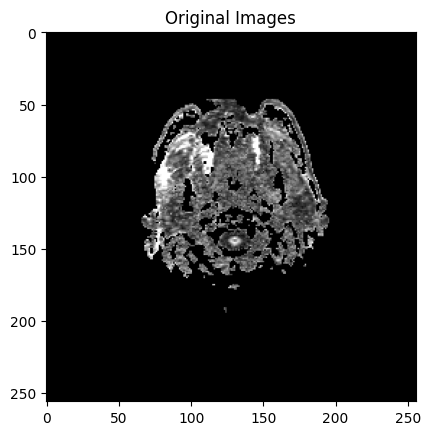

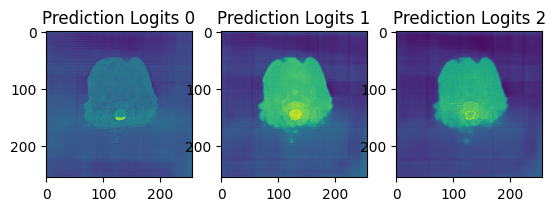

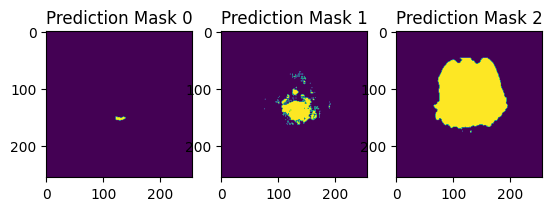

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


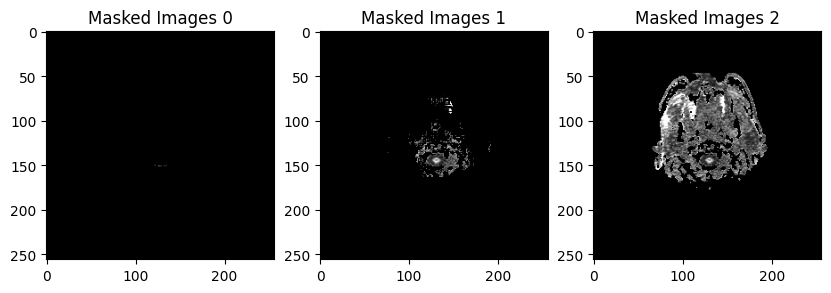

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 1.


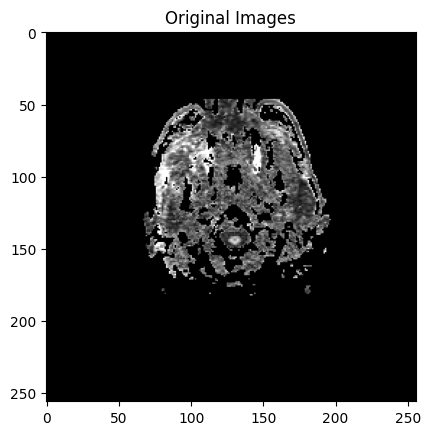

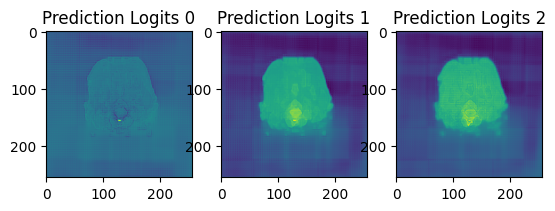

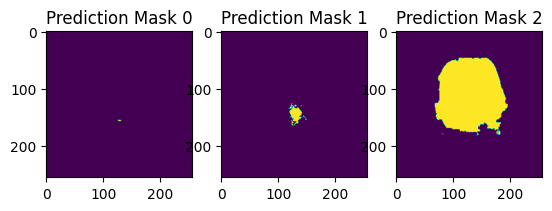

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


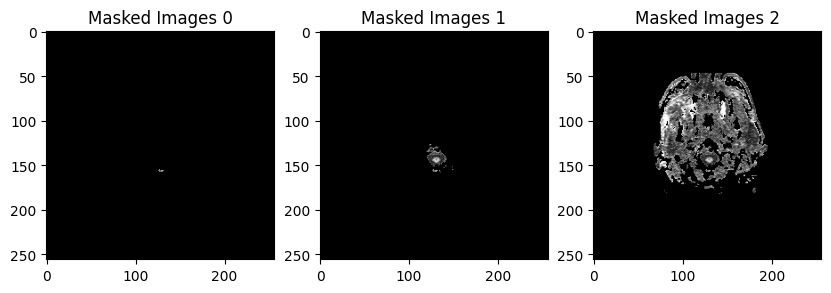

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 2.


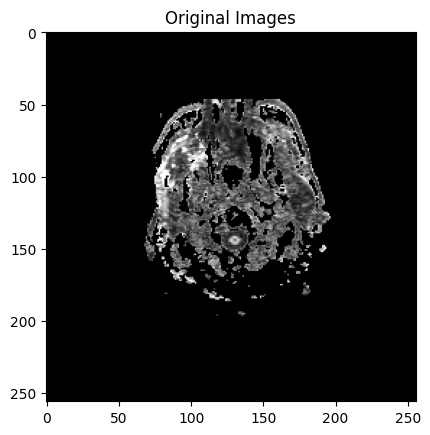

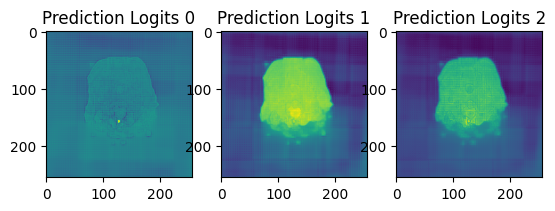

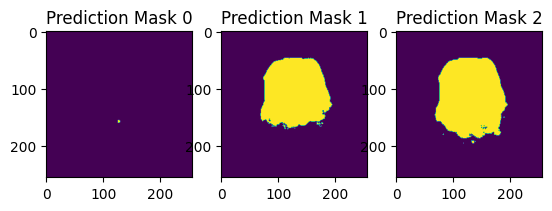

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


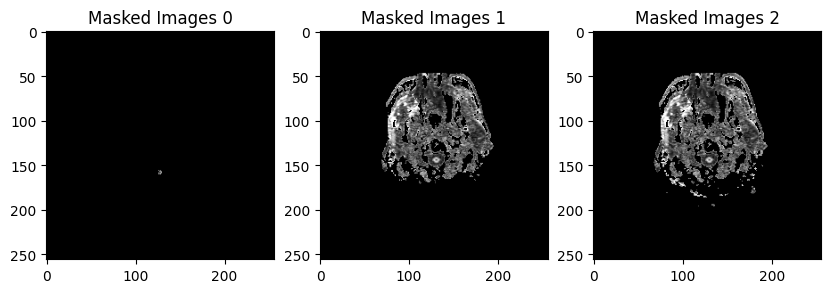

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 3.


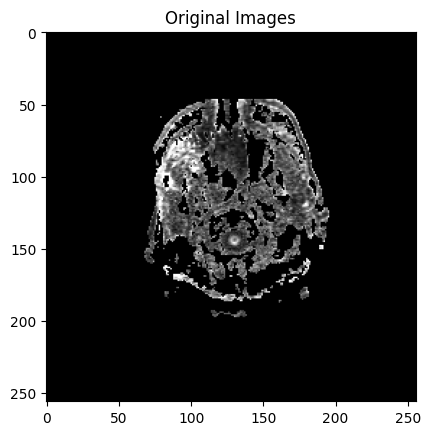

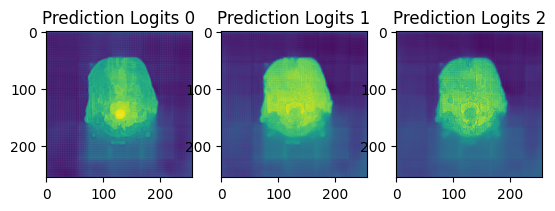

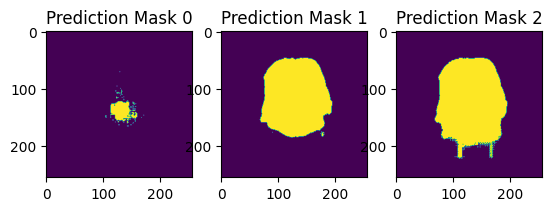

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


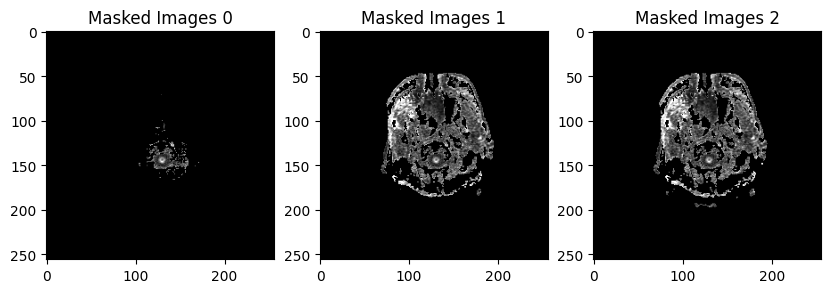

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 4.


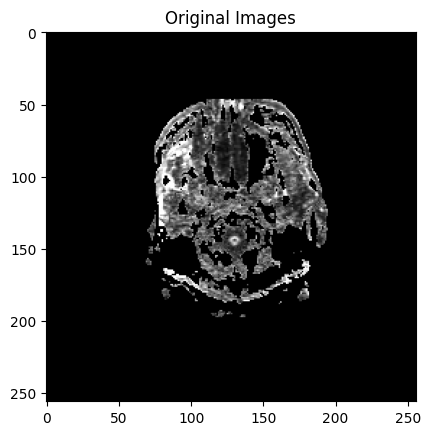

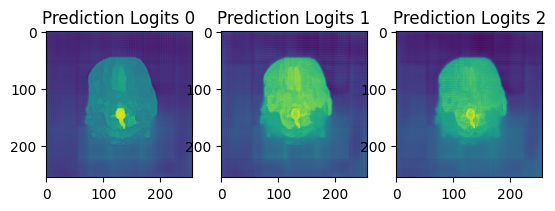

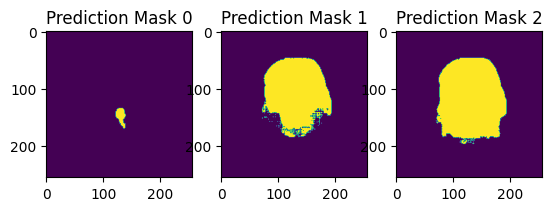

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


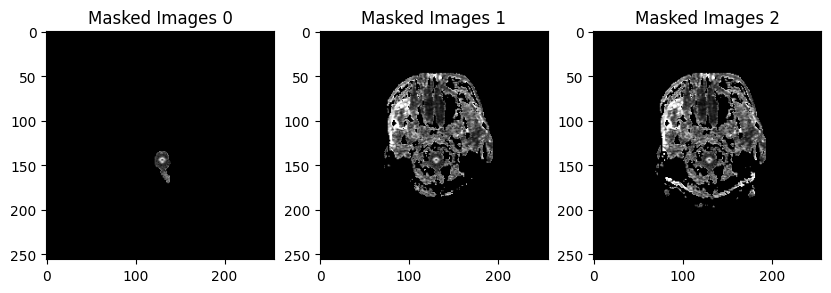

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 5.


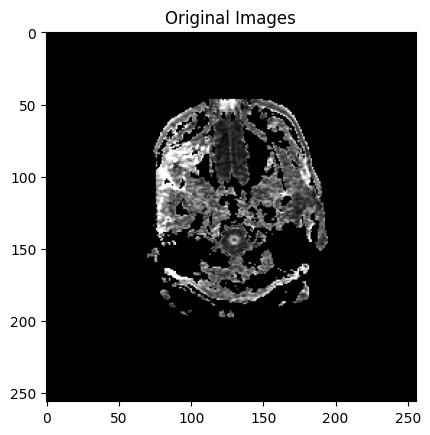

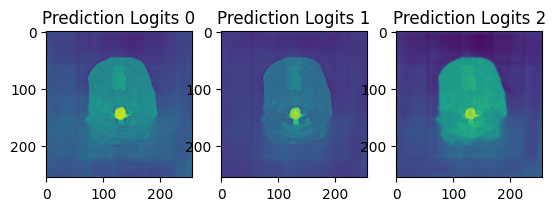

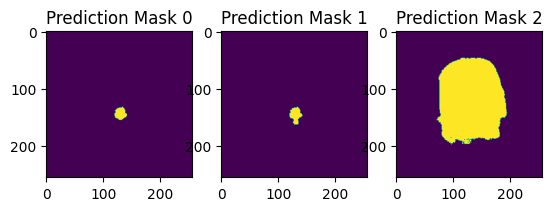

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


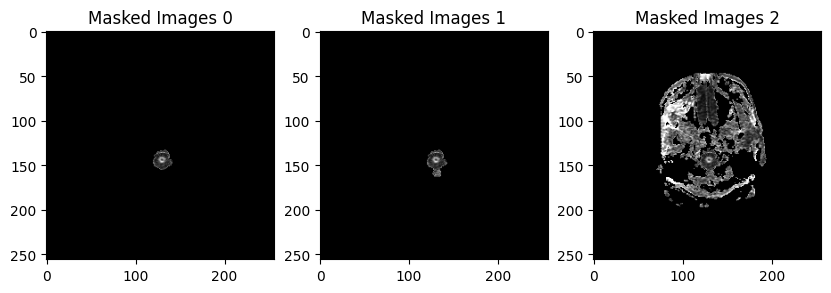

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 6.


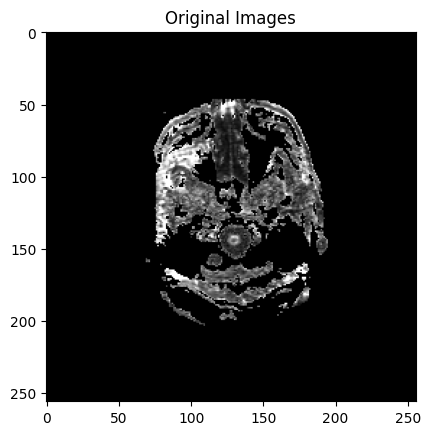

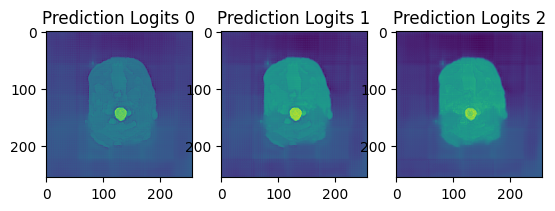

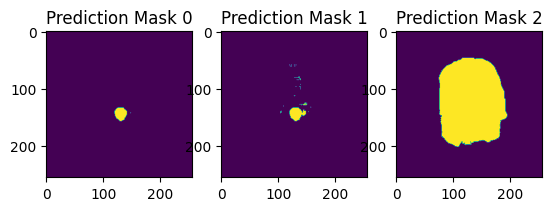

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


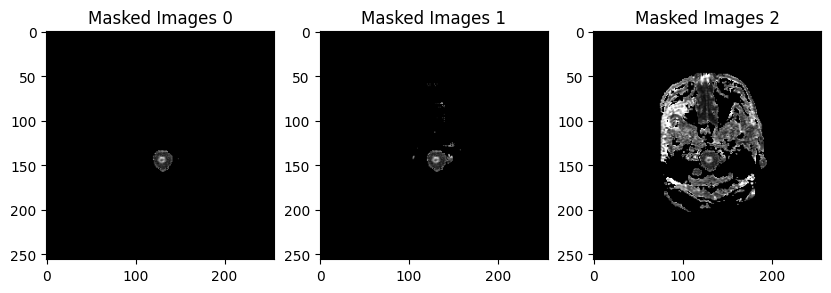

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 7.


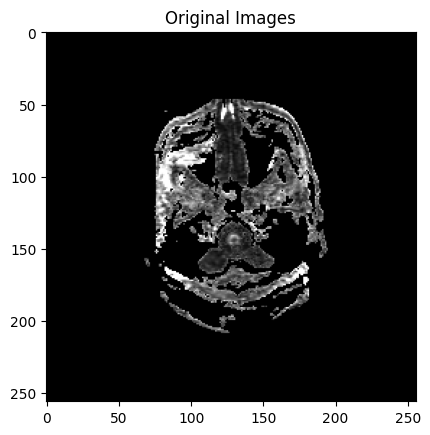

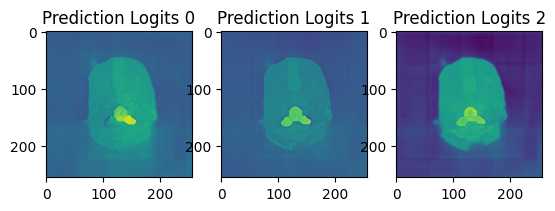

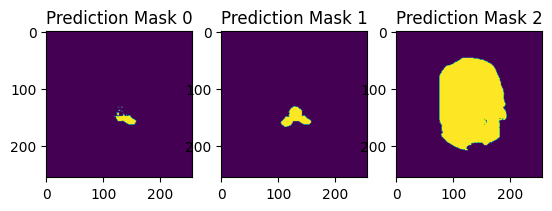

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


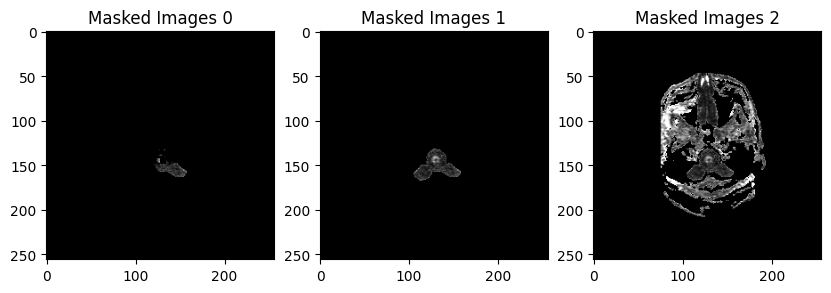

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 8.


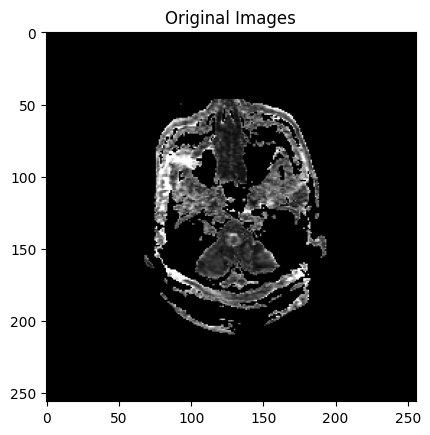

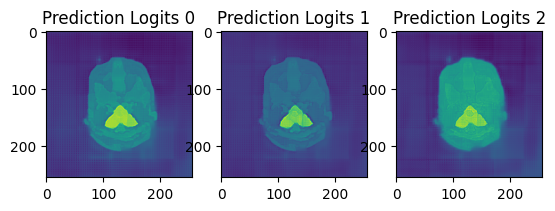

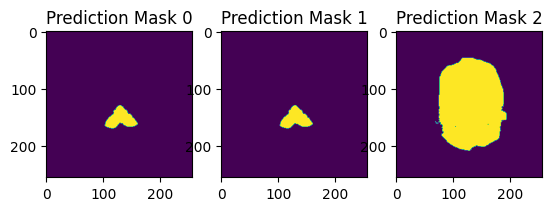

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


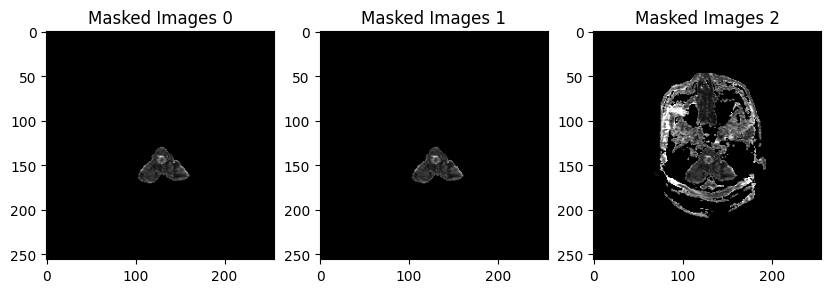

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 9.


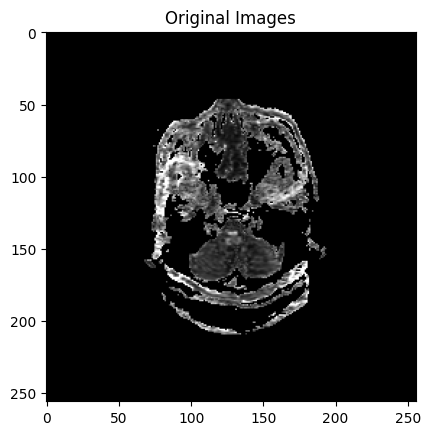

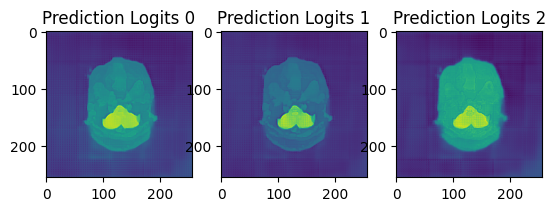

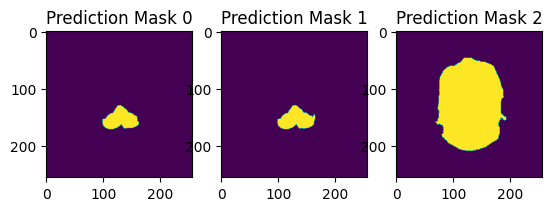

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


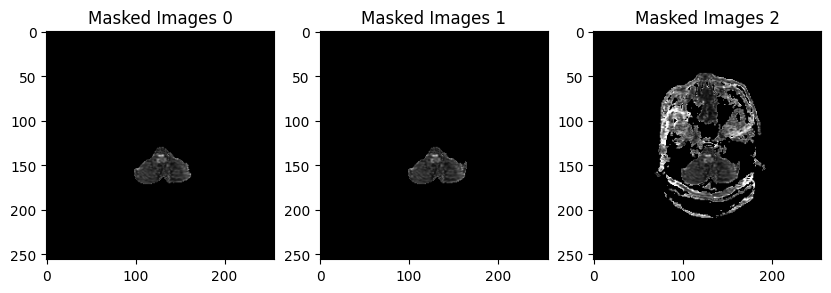

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 10.


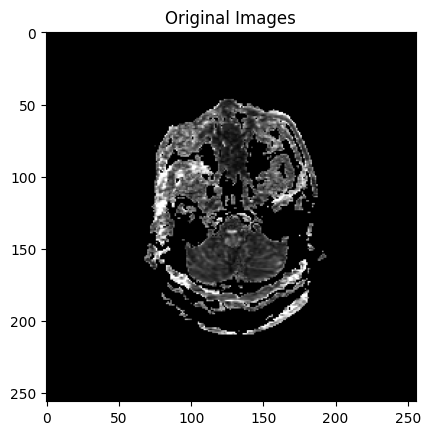

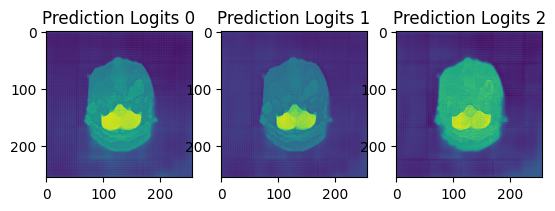

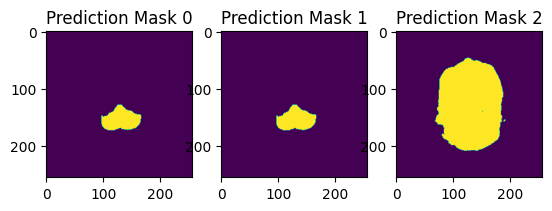

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


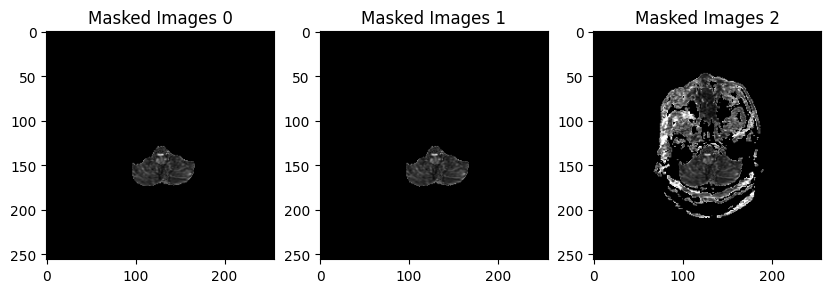

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 11.


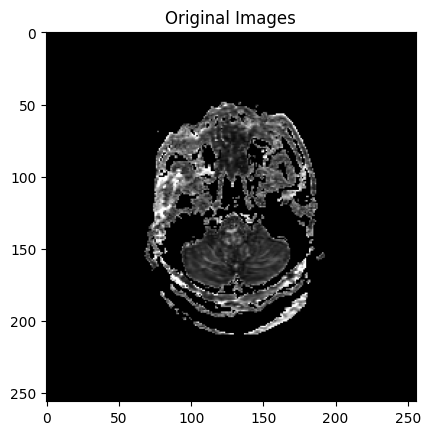

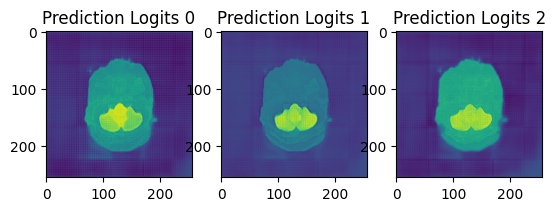

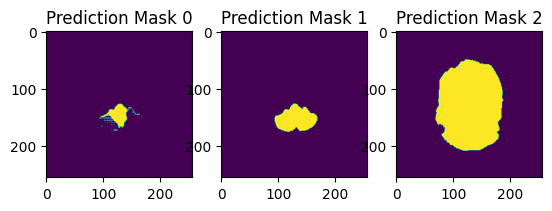

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


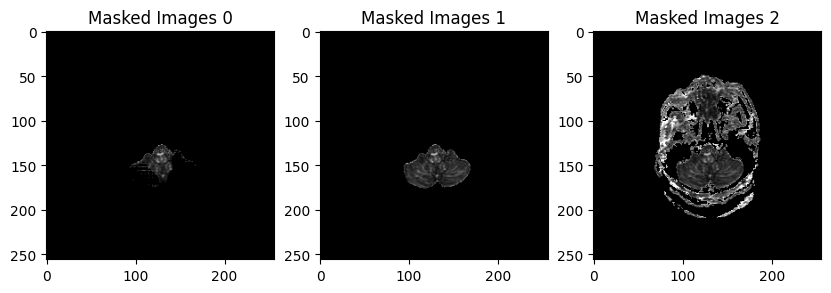

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 12.


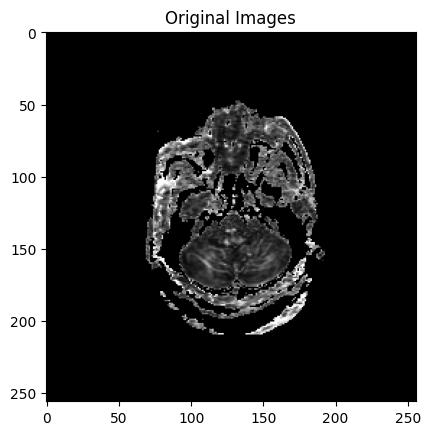

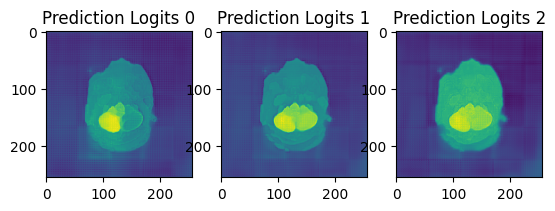

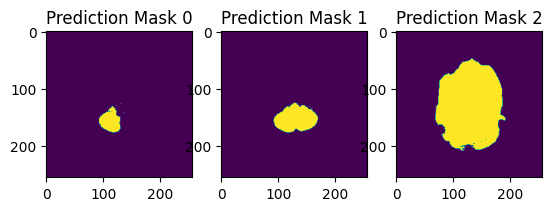

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


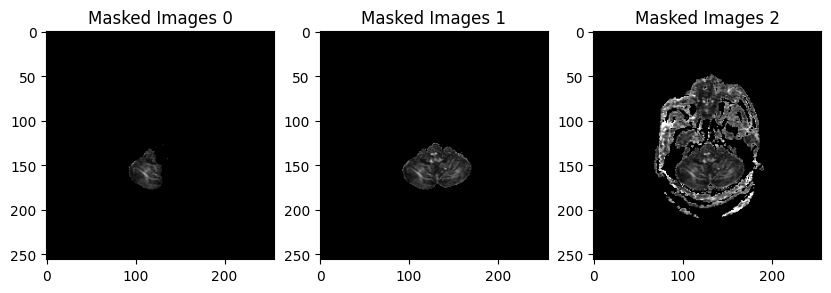

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 13.


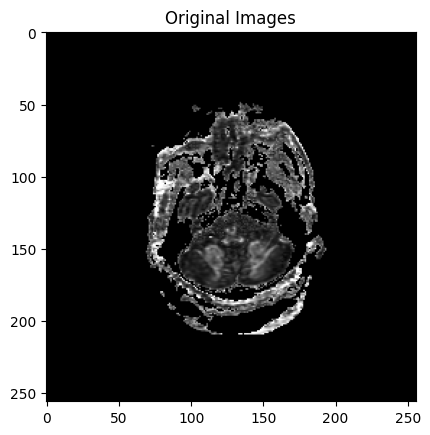

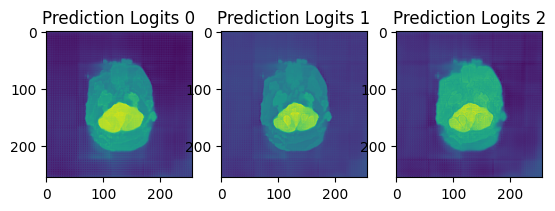

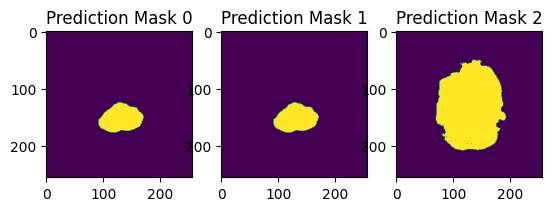

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


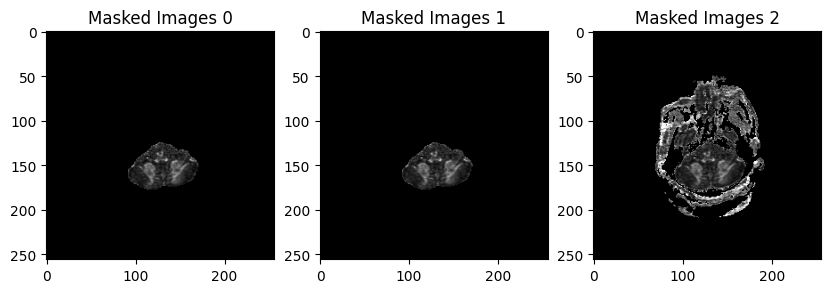

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 14.


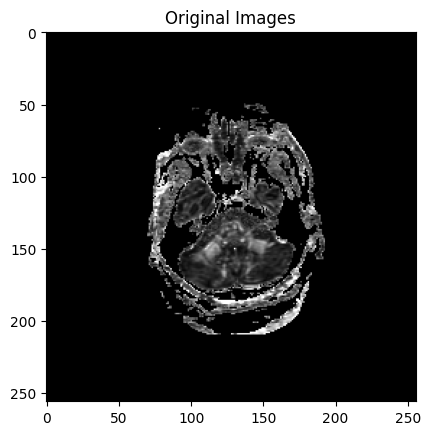

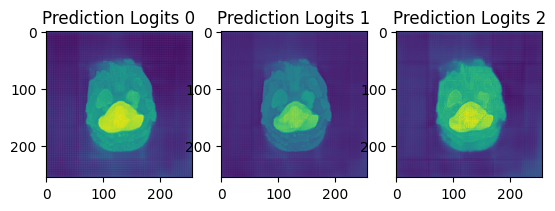

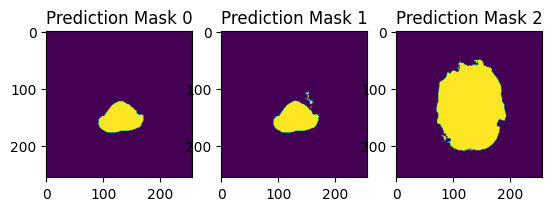

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


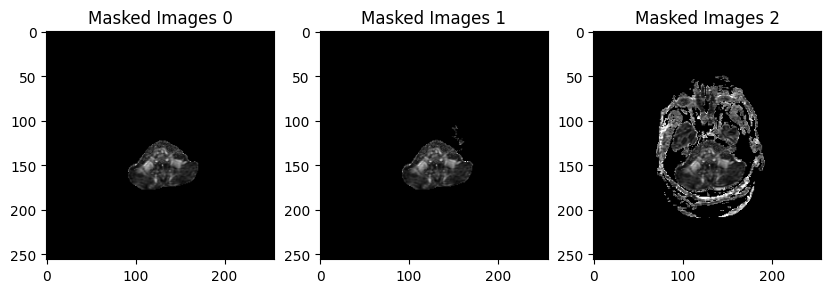

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 15.


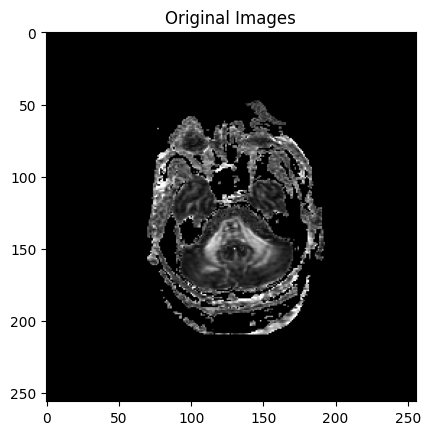

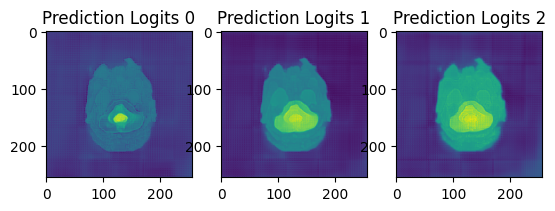

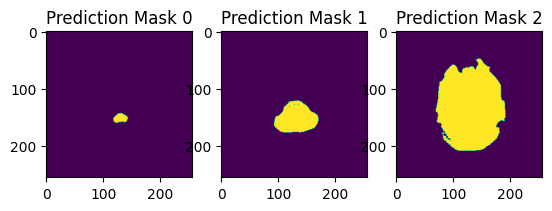

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


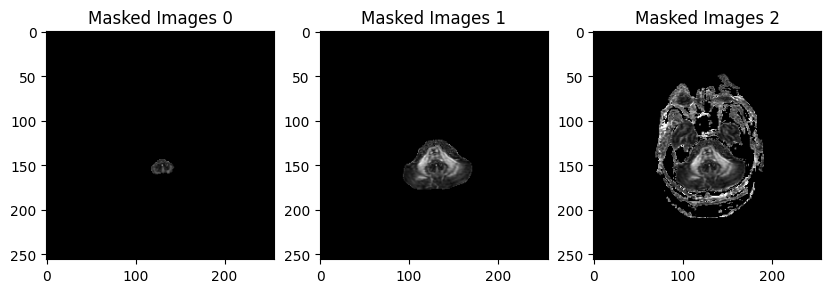

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 16.


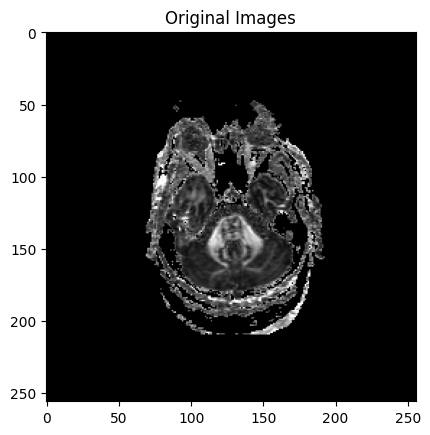

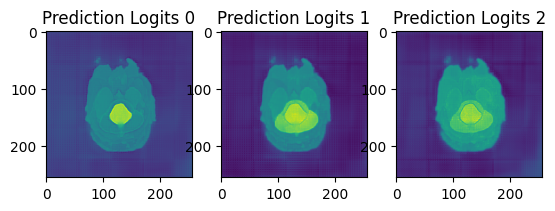

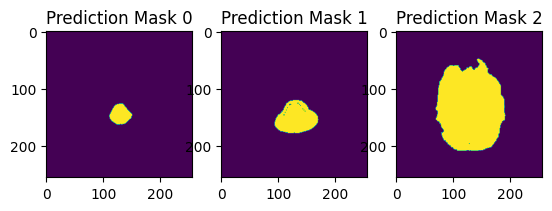

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


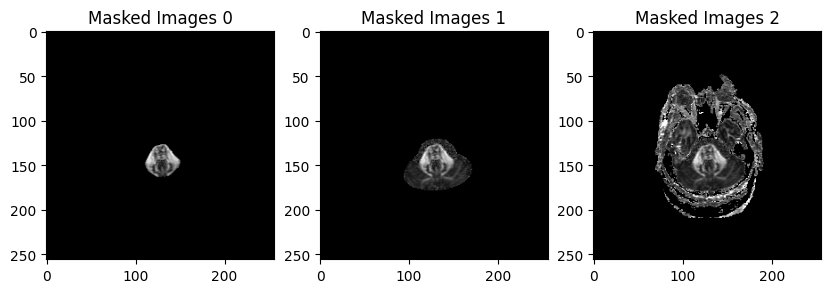

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 17.


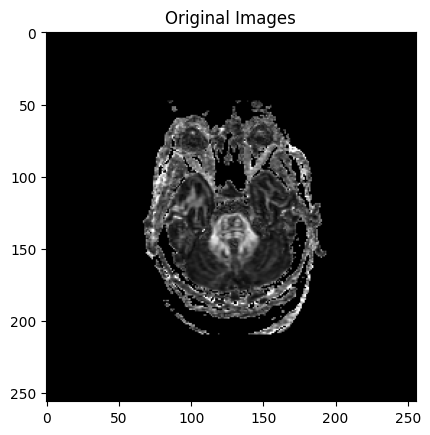

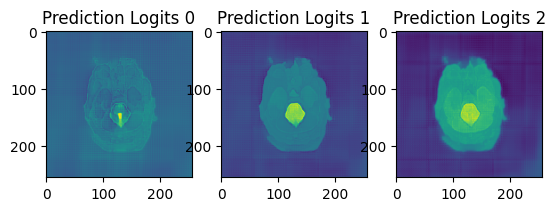

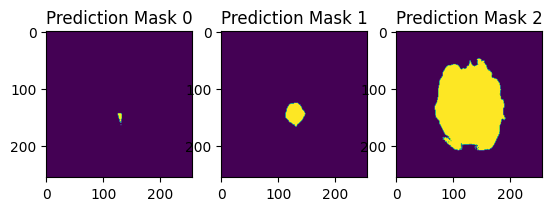

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


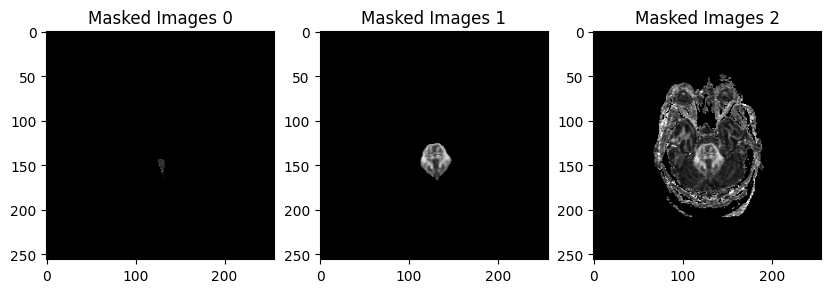

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 18.


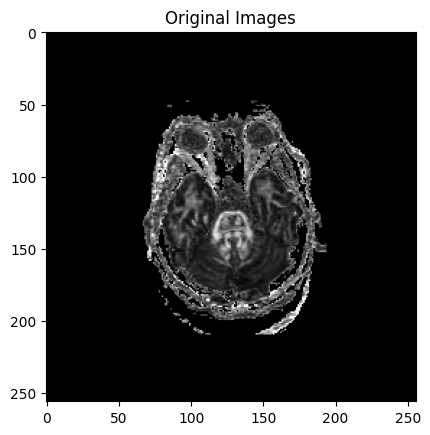

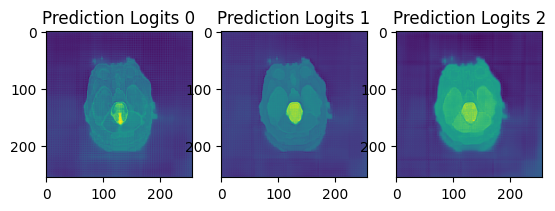

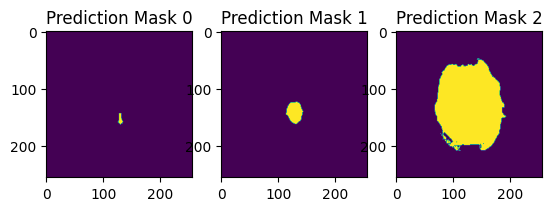

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


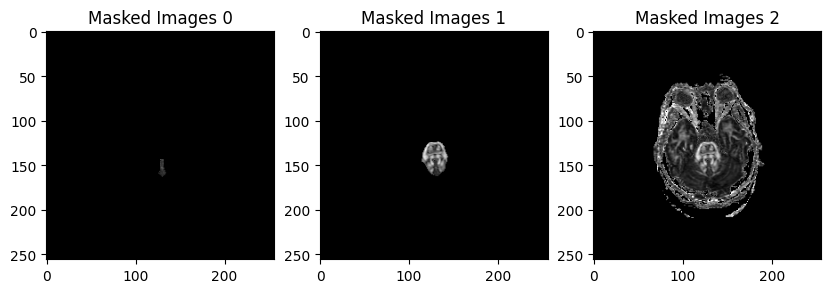

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 19.


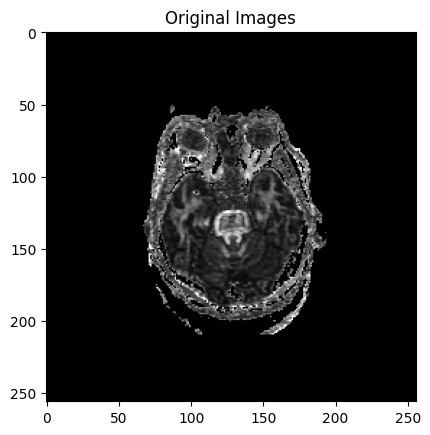

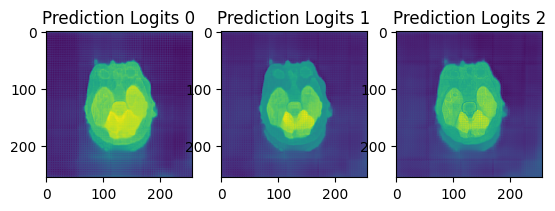

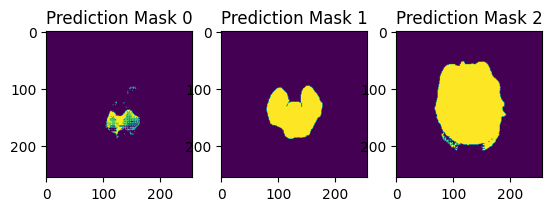

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


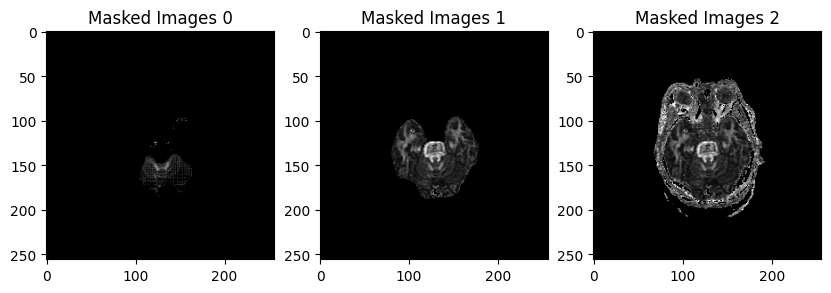

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 20.


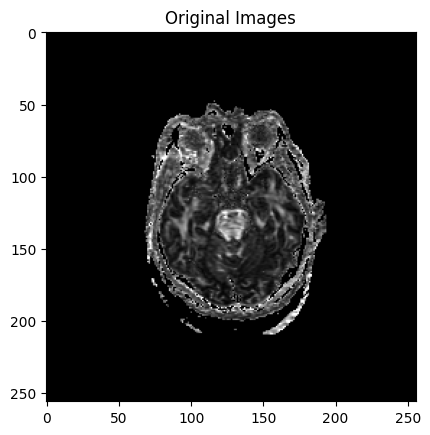

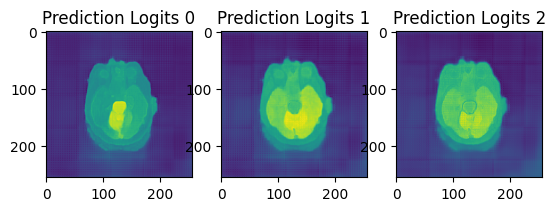

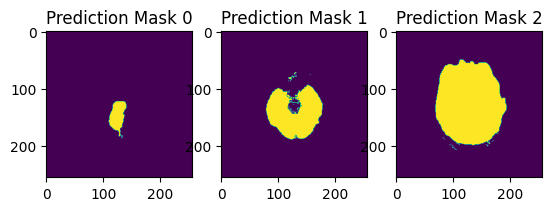

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


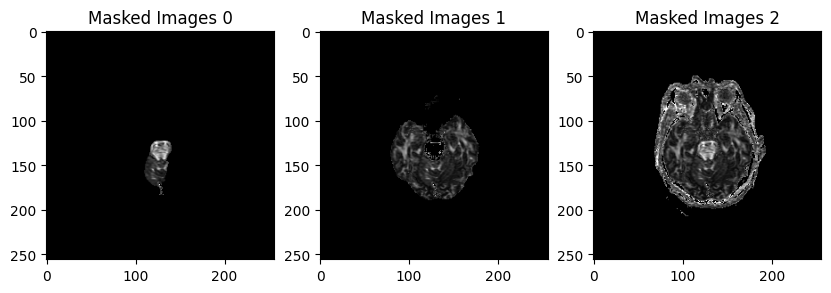

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 21.


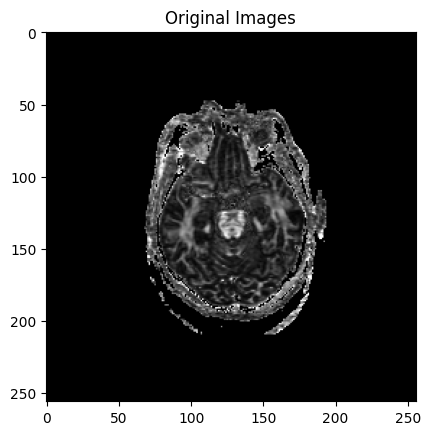

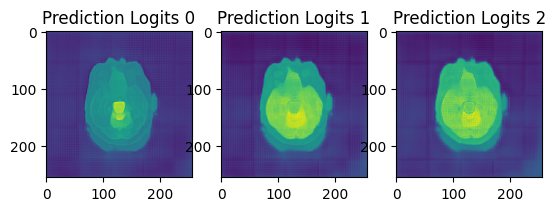

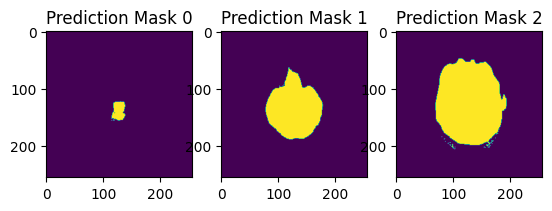

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


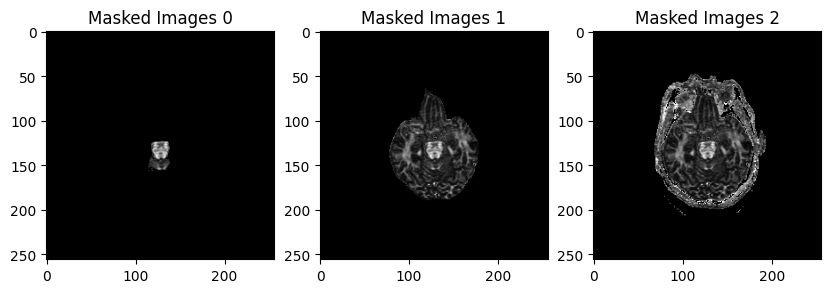

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 22.


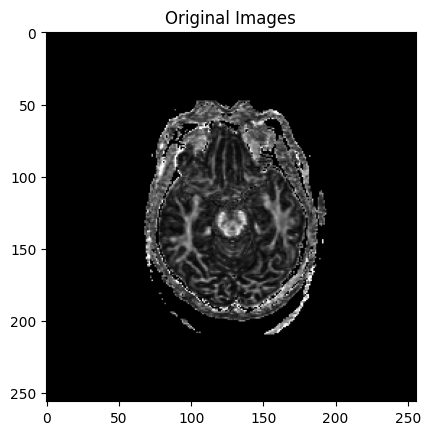

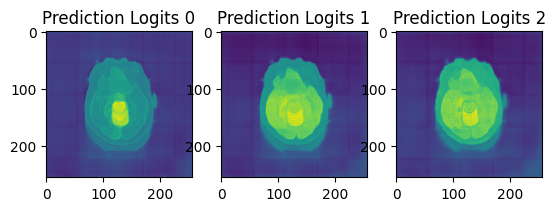

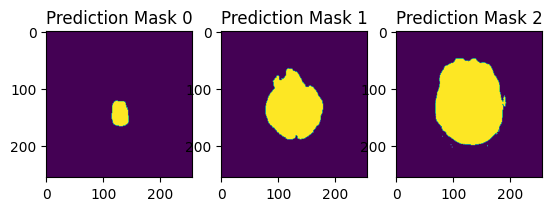

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


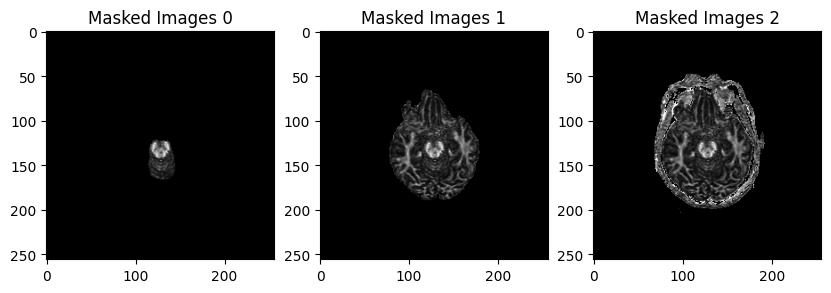

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 23.


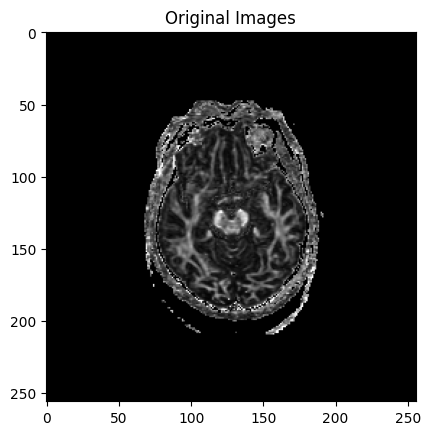

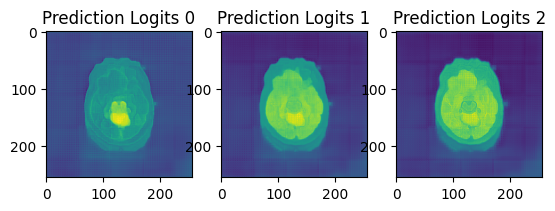

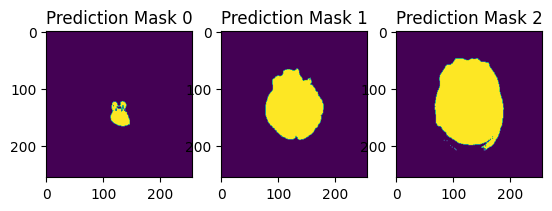

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


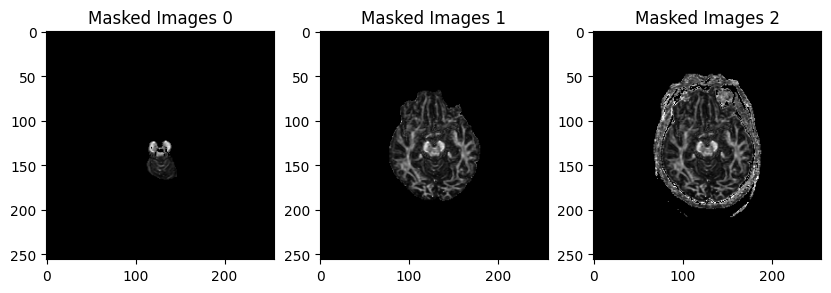

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 24.


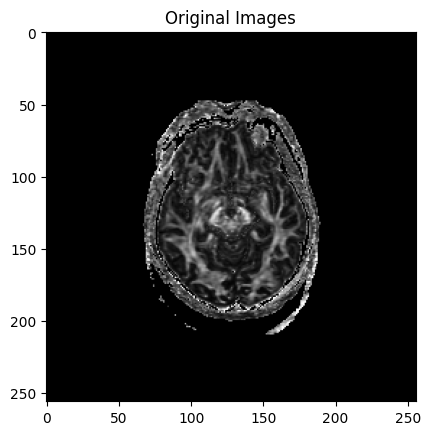

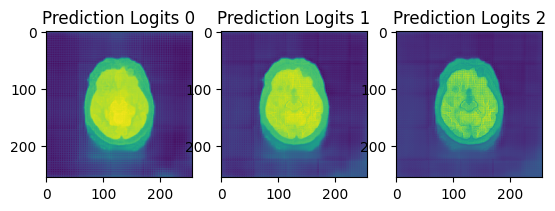

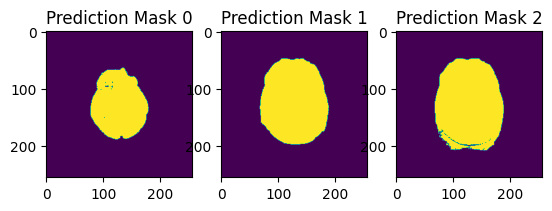

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


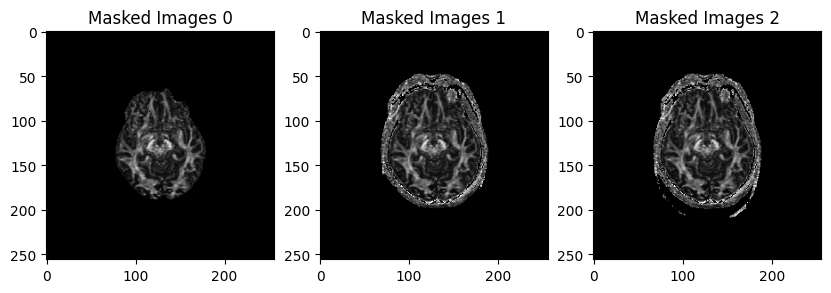

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 25.


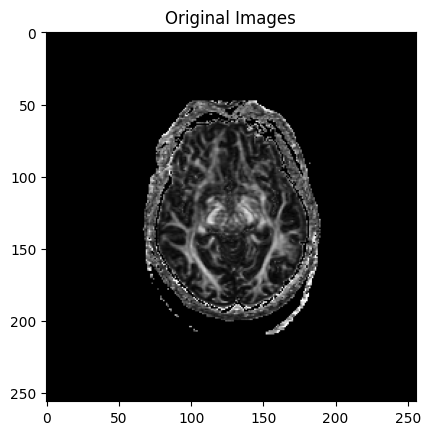

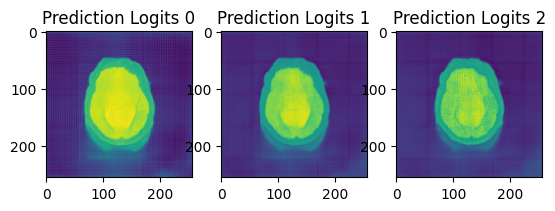

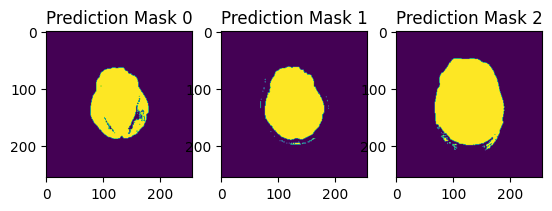

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


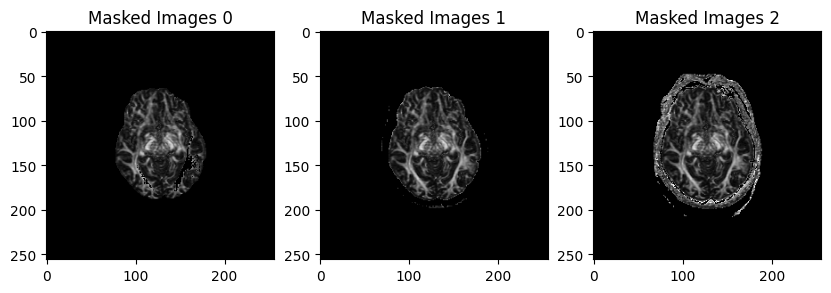

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 26.


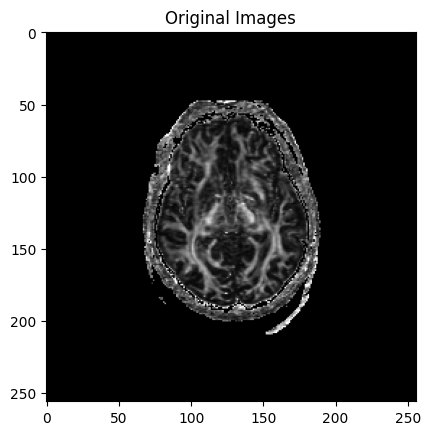

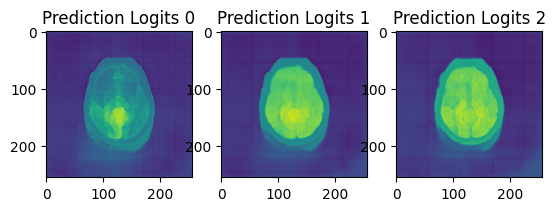

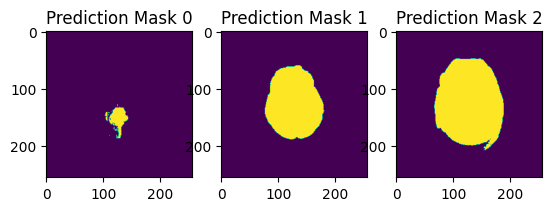

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


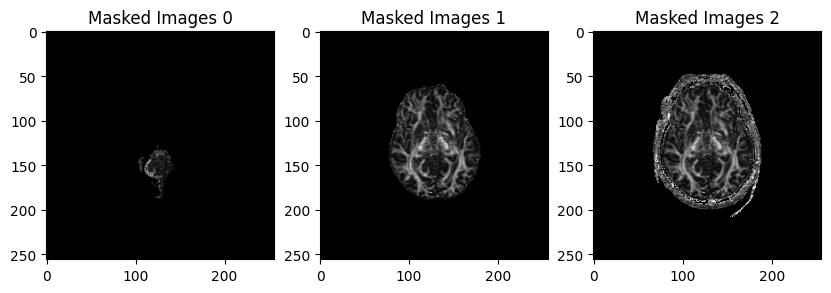

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 27.


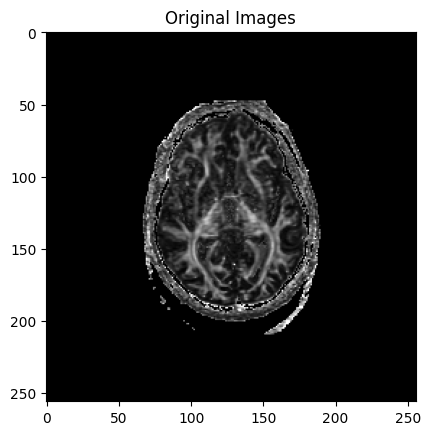

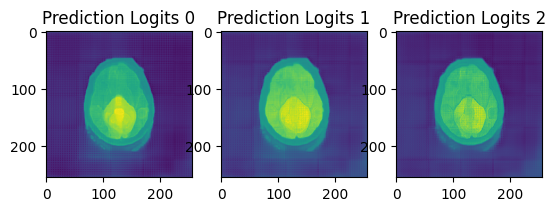

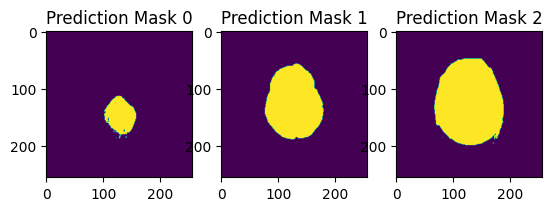

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


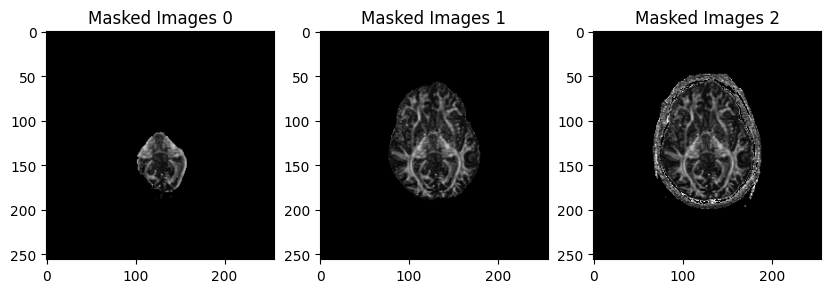

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 28.


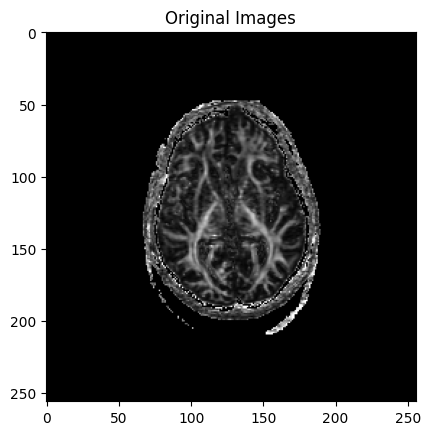

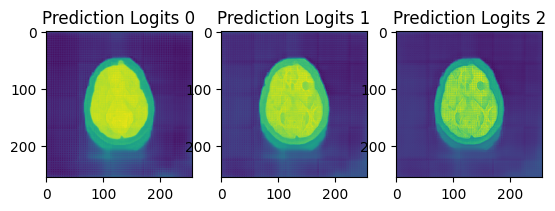

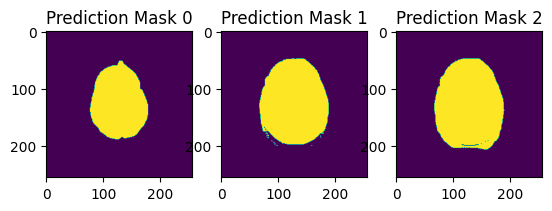

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


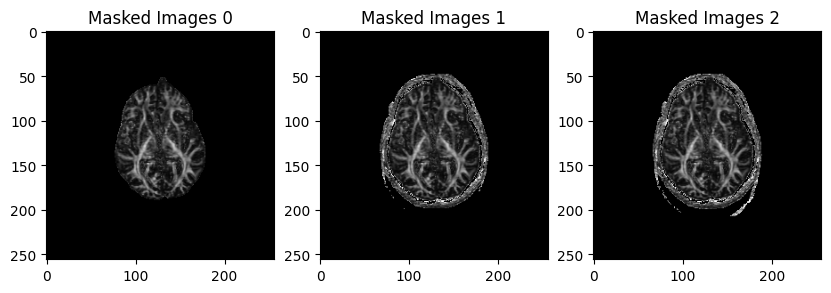

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 29.


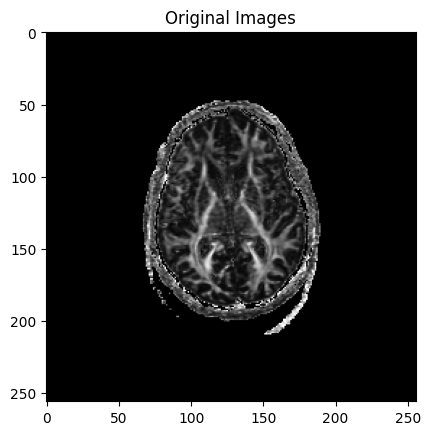

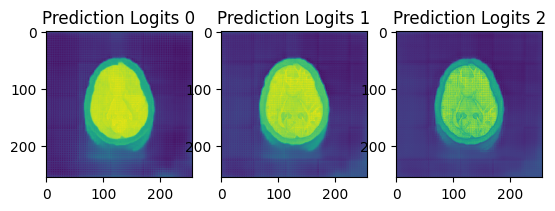

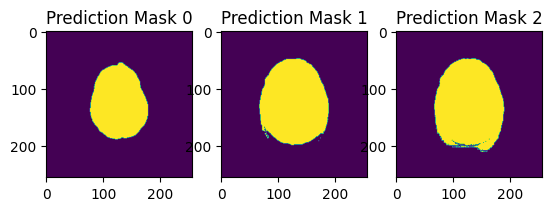

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


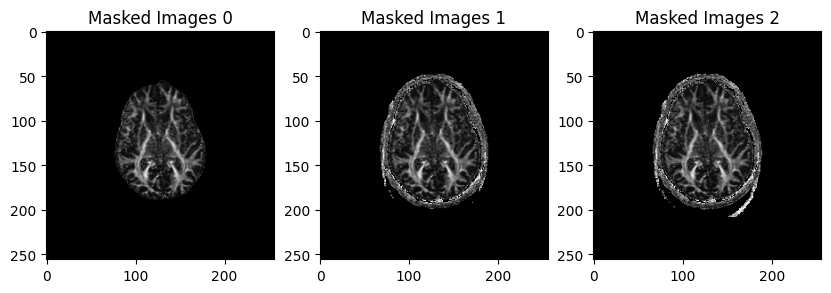

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 30.


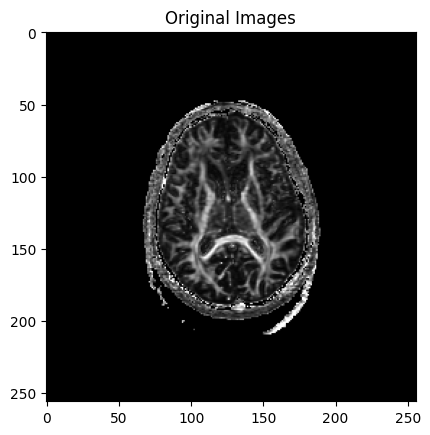

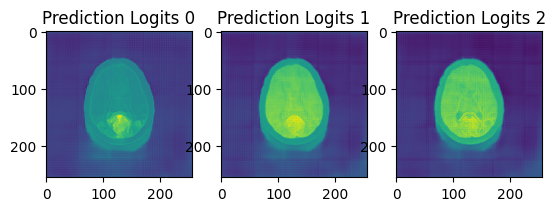

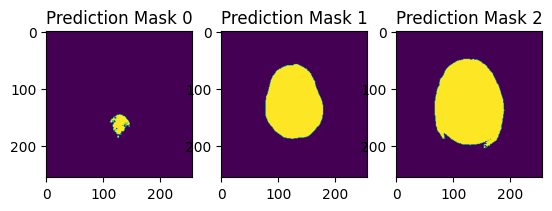

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


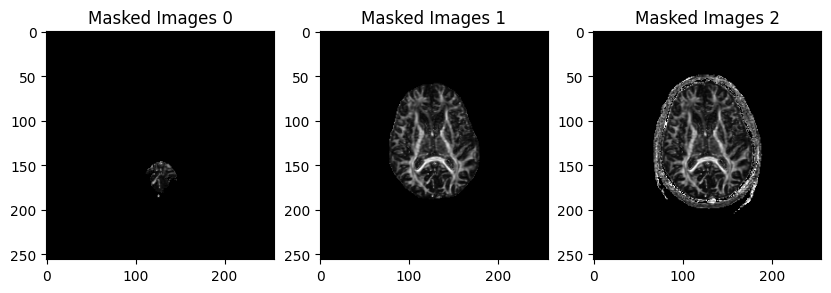

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 31.


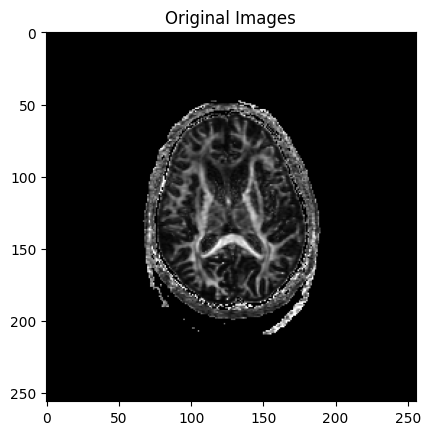

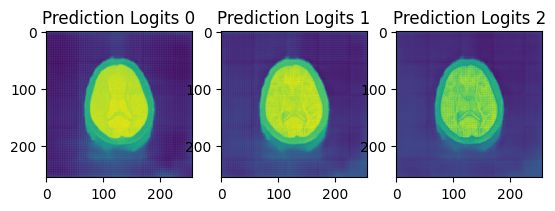

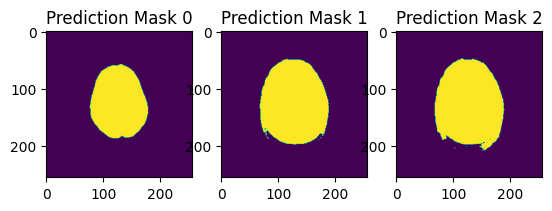

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


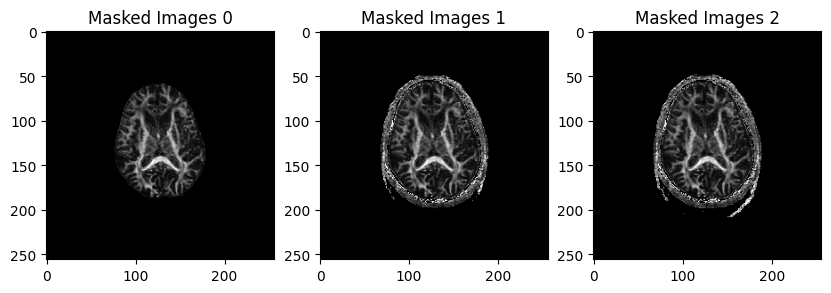

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 32.


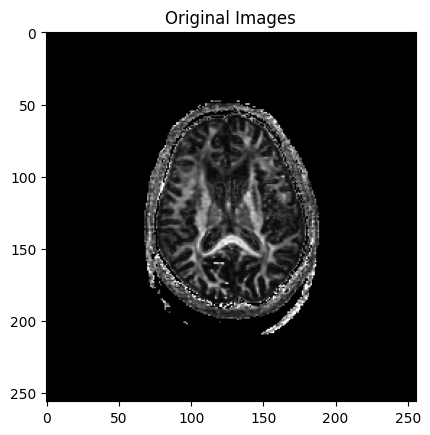

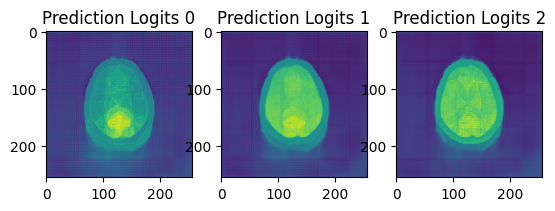

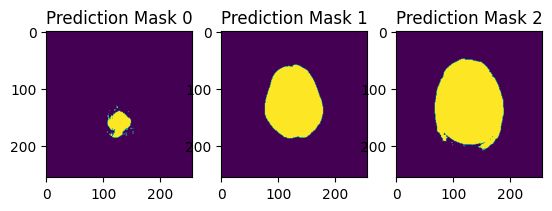

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


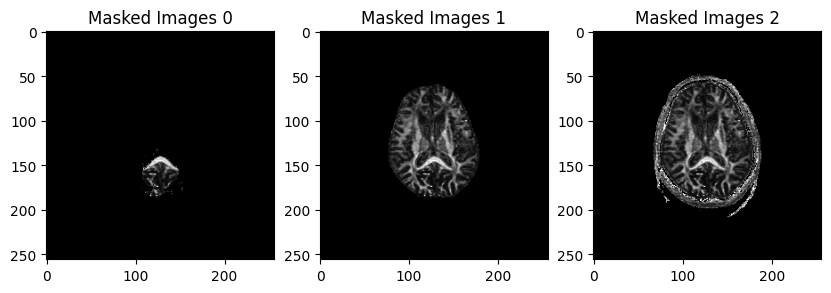

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 33.


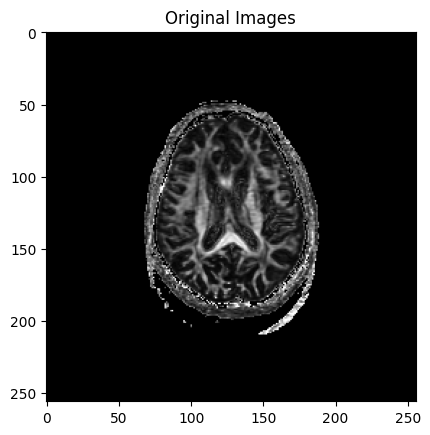

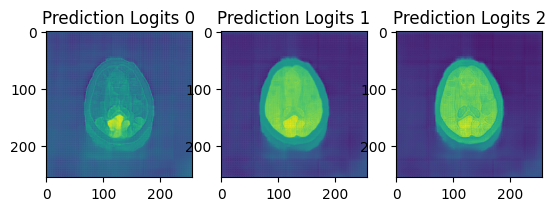

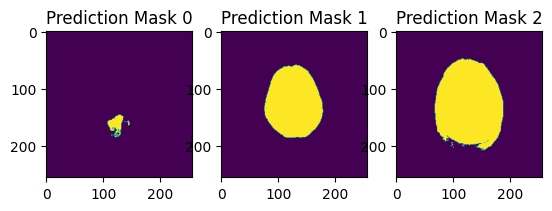

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


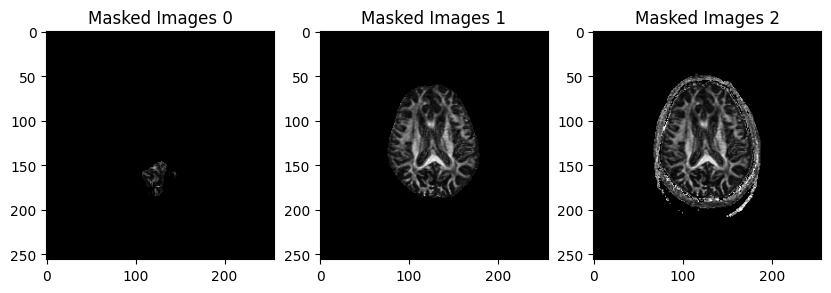

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 34.


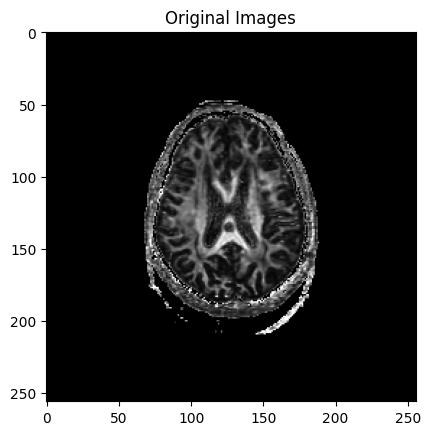

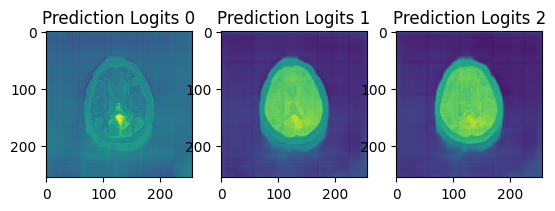

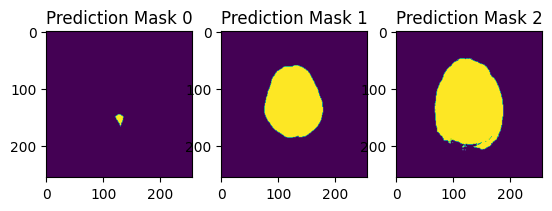

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


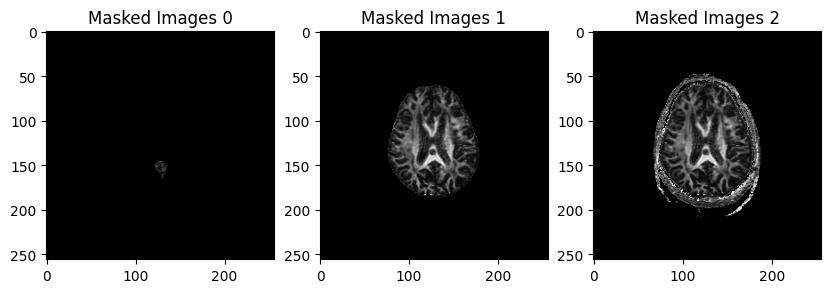

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 35.


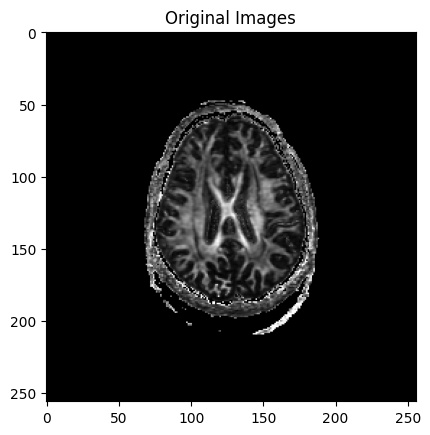

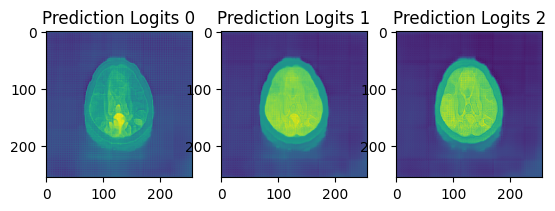

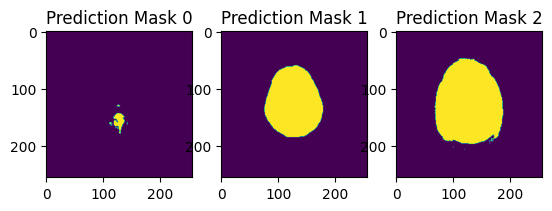

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


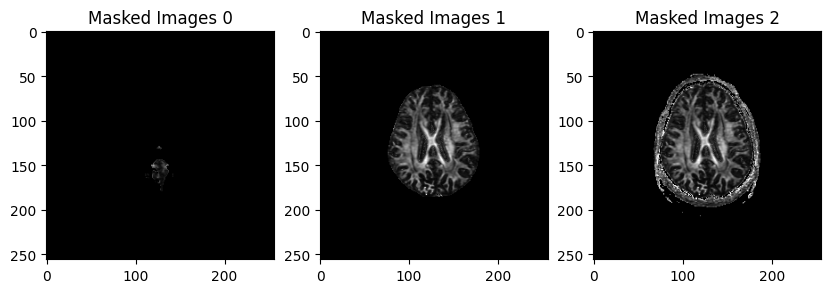

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 36.


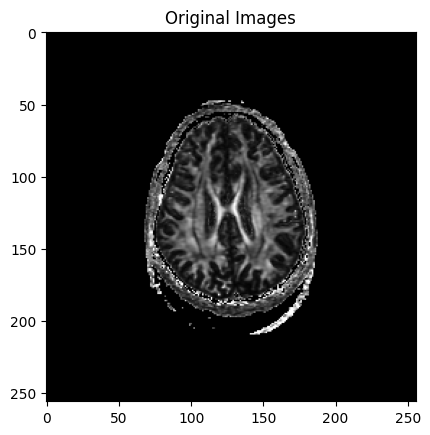

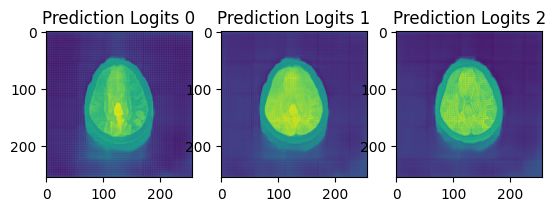

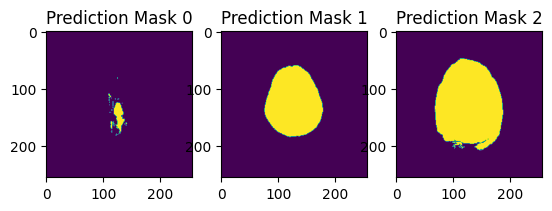

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


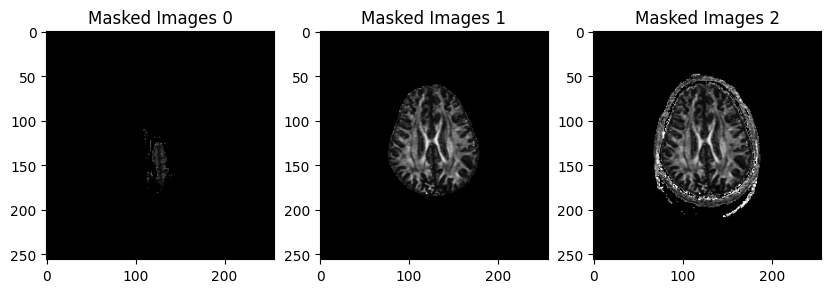

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 37.


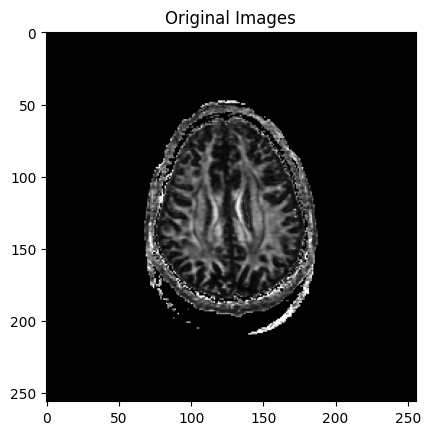

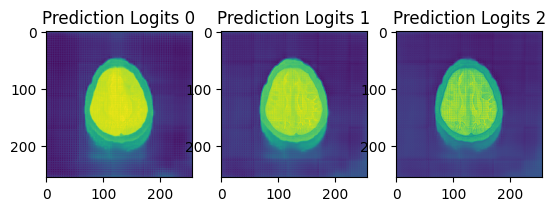

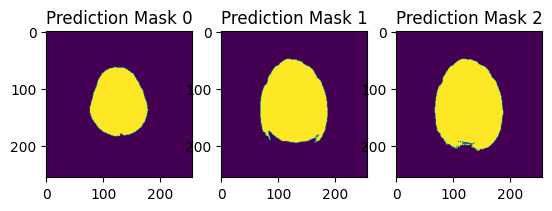

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


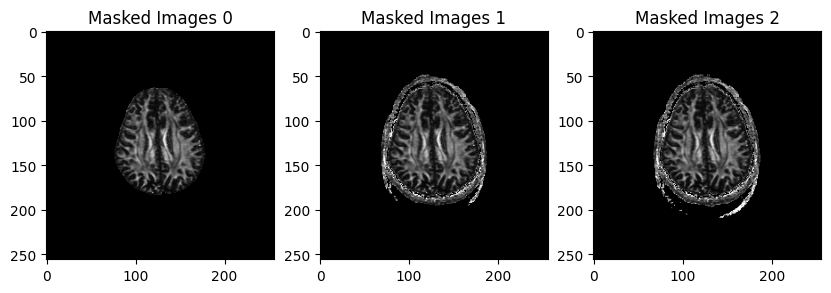

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 38.


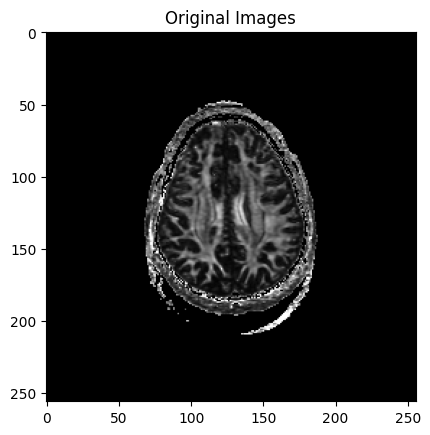

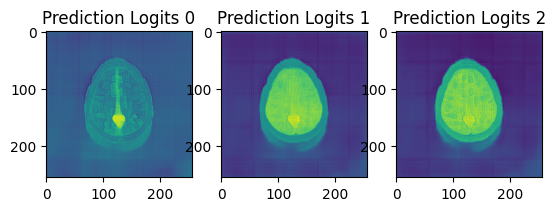

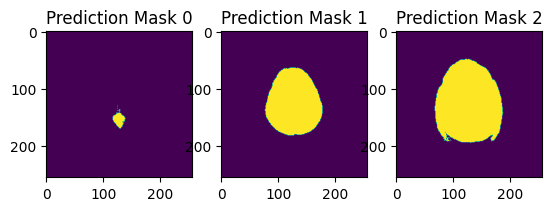

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


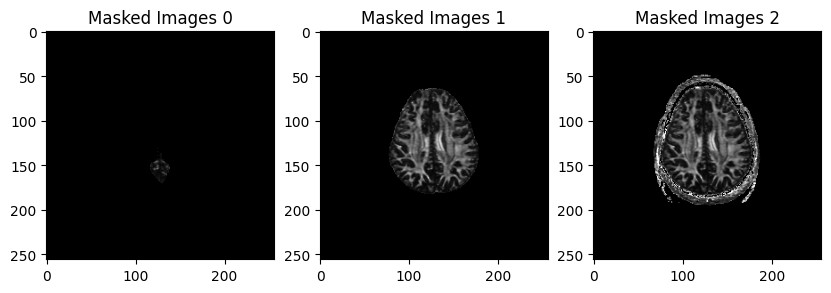

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 39.


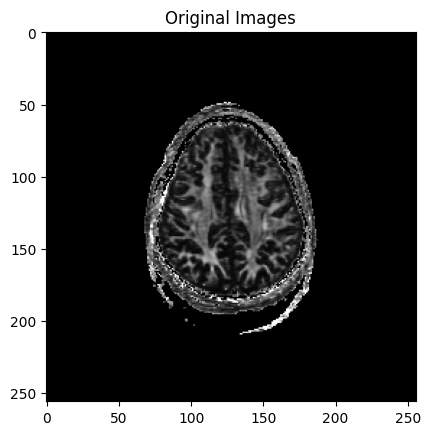

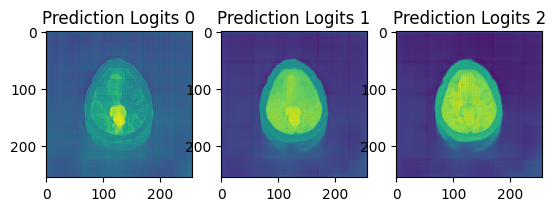

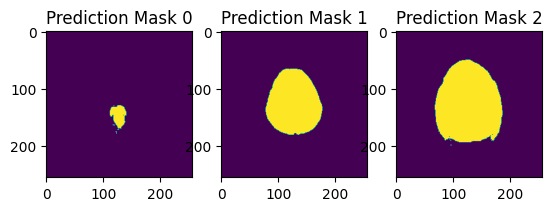

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


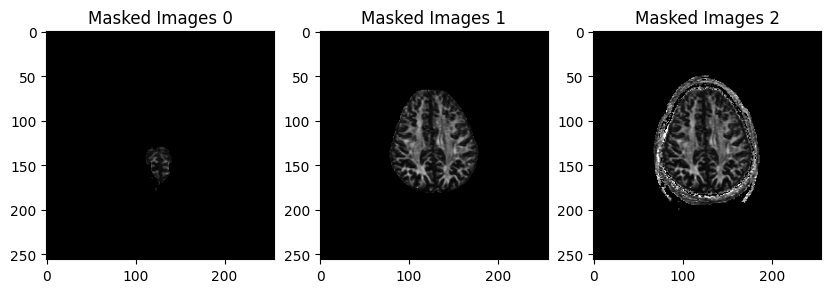

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 40.


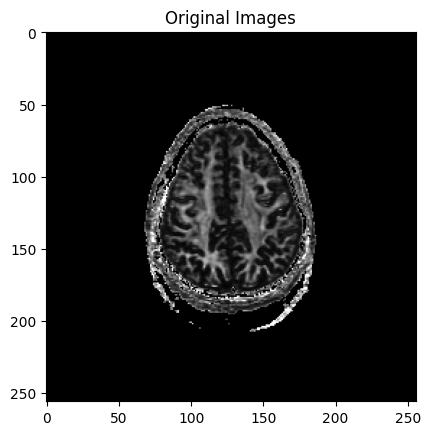

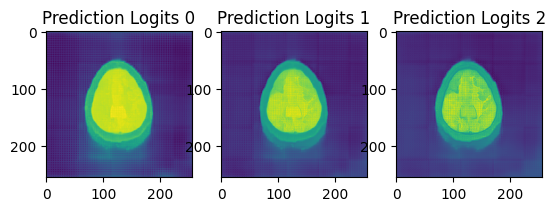

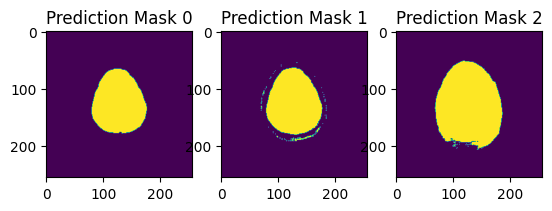

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


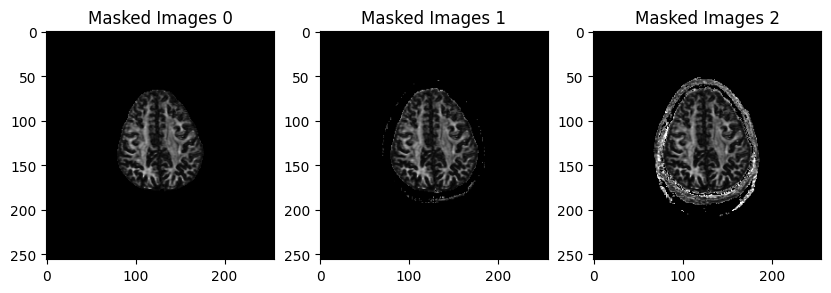

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 41.


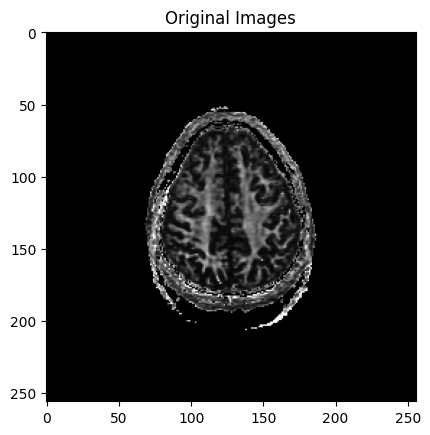

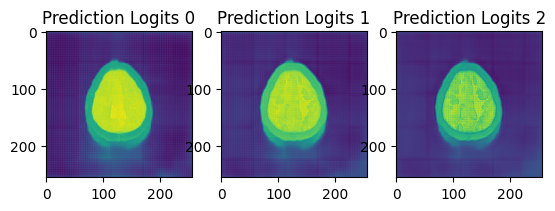

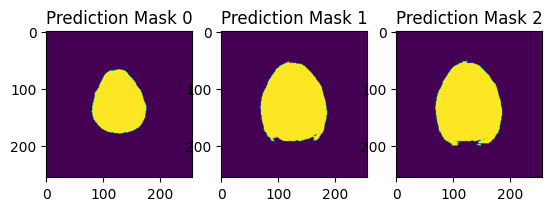

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


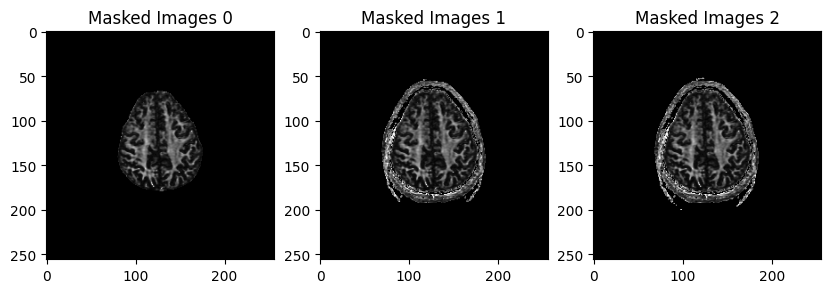

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 42.


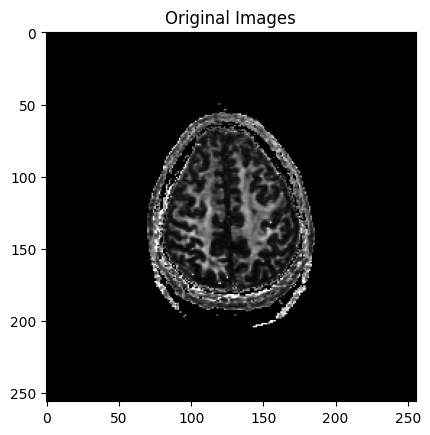

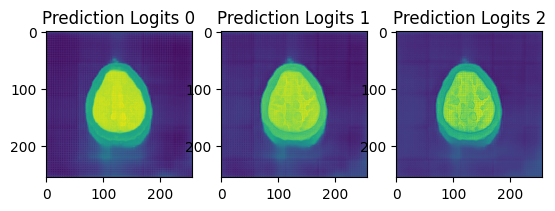

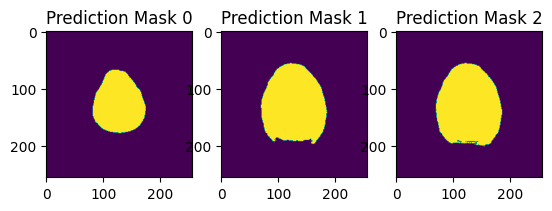

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


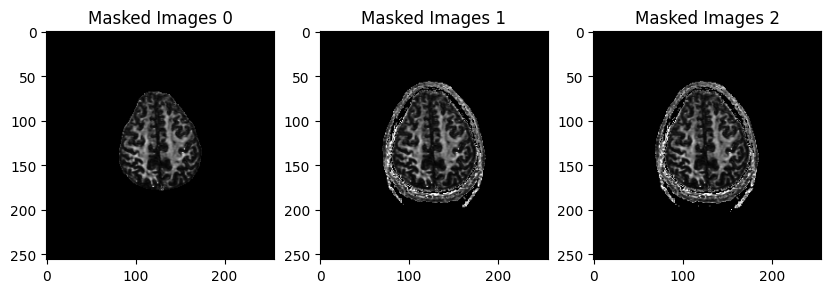

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 43.


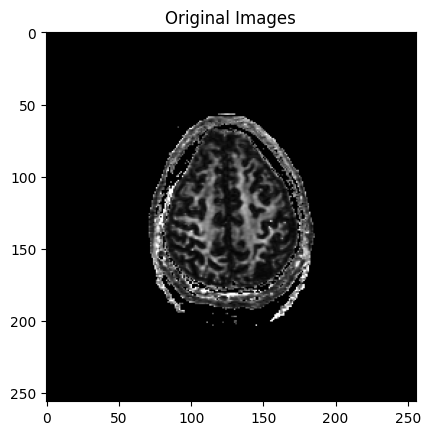

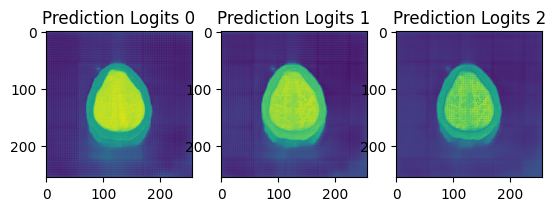

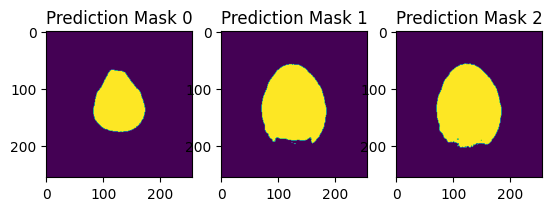

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


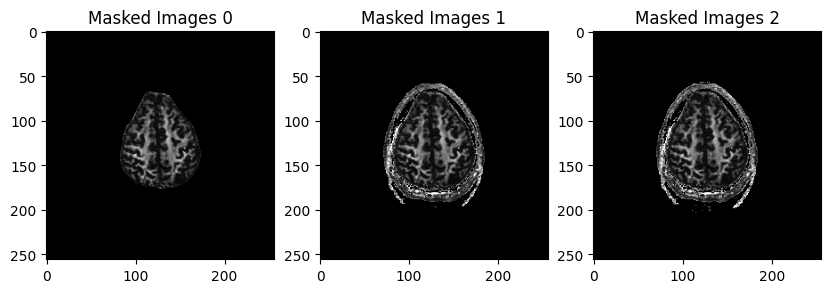

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 44.


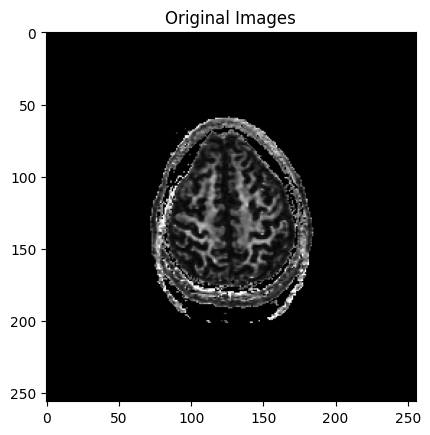

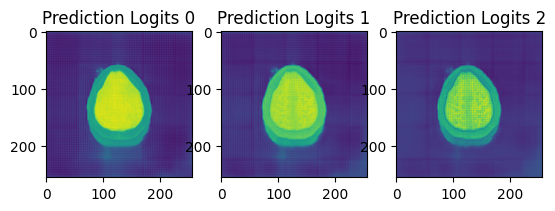

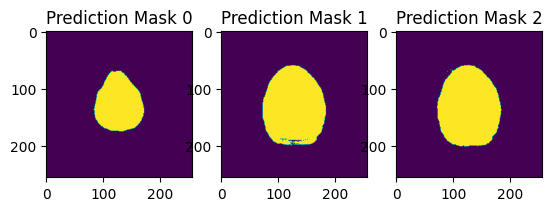

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


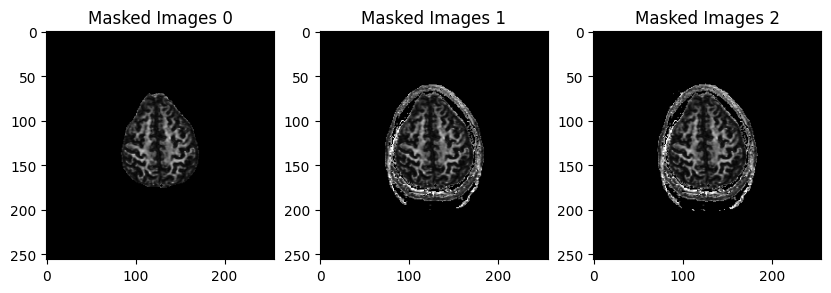

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 45.


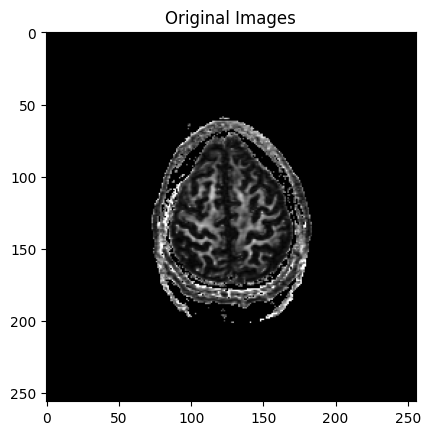

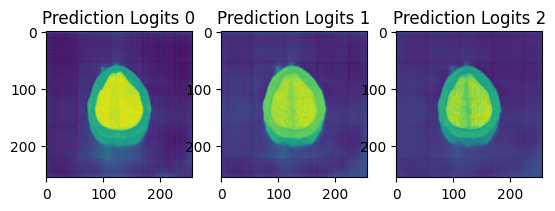

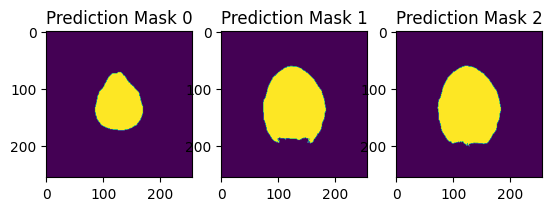

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


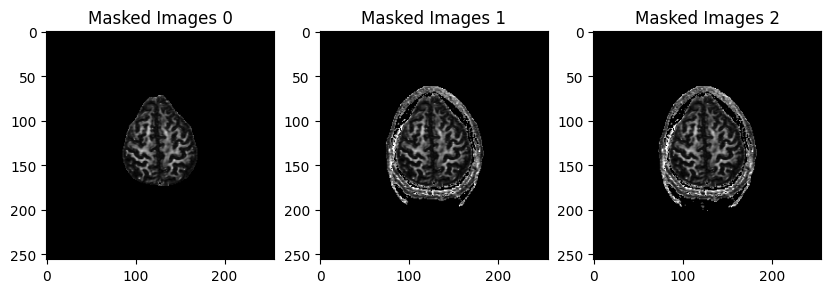

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 46.


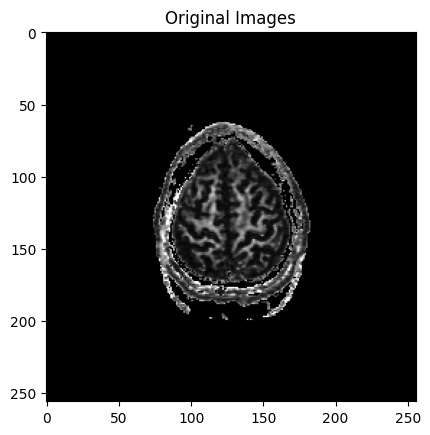

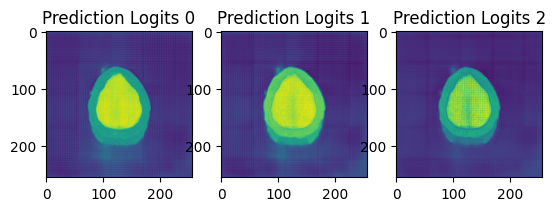

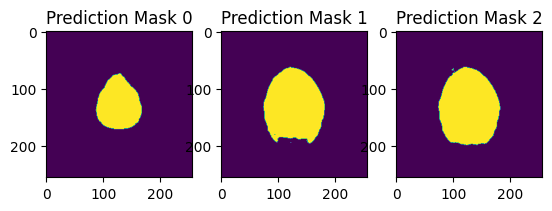

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


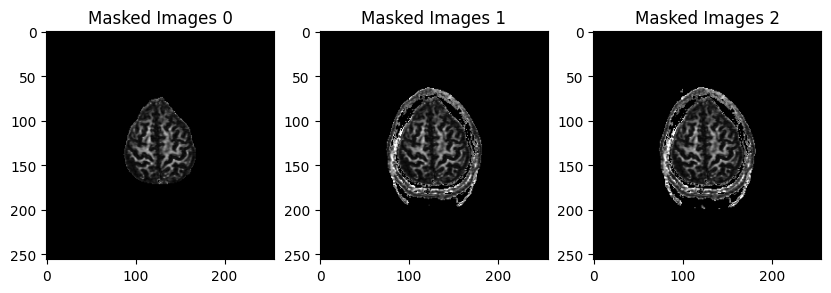

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 47.


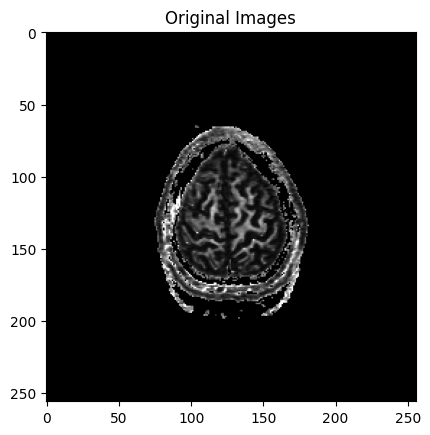

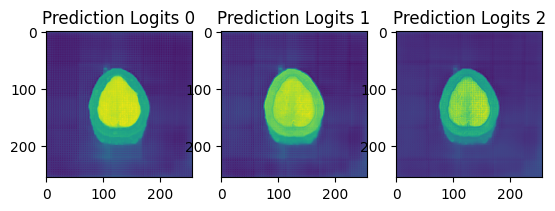

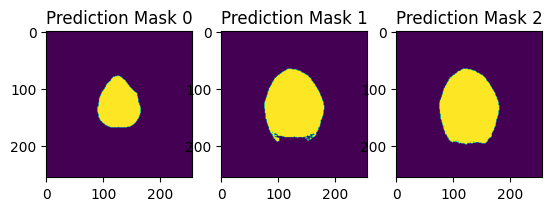

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


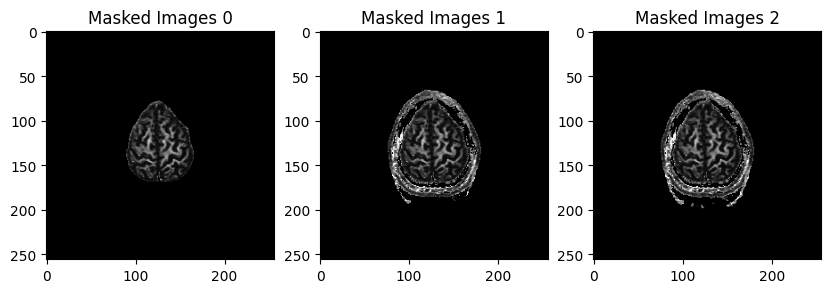

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 48.


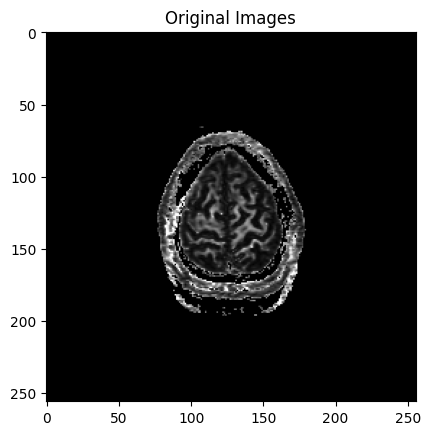

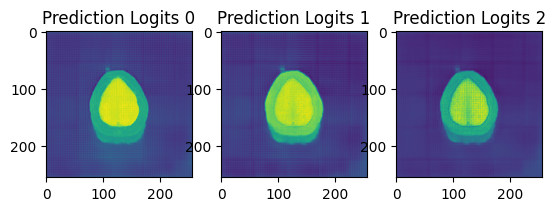

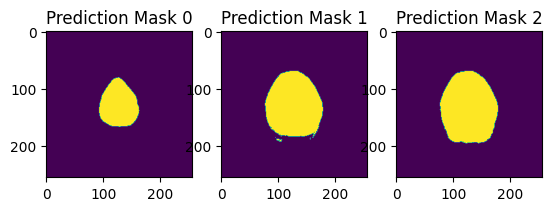

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


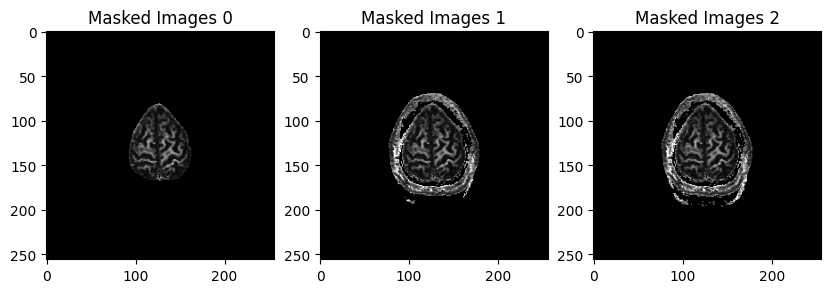

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 49.


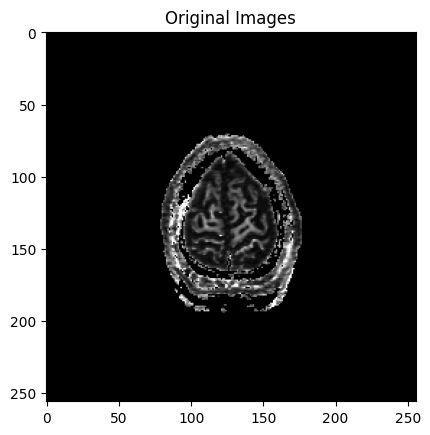

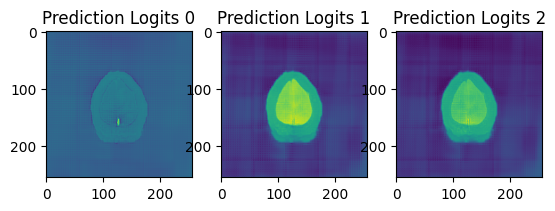

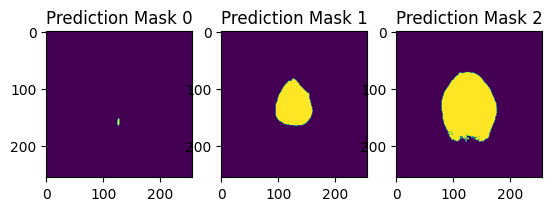

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


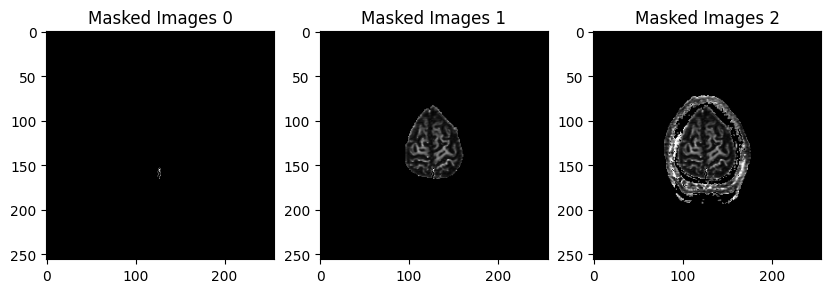

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 50.


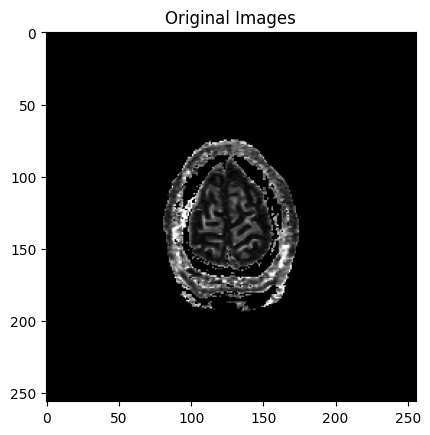

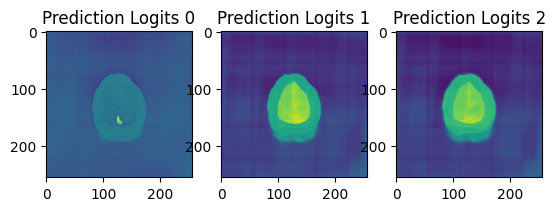

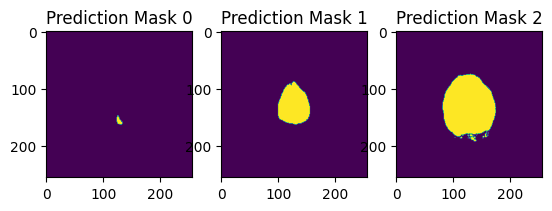

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


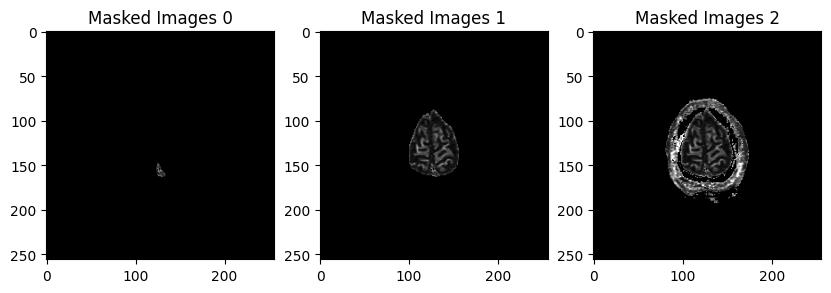

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 51.


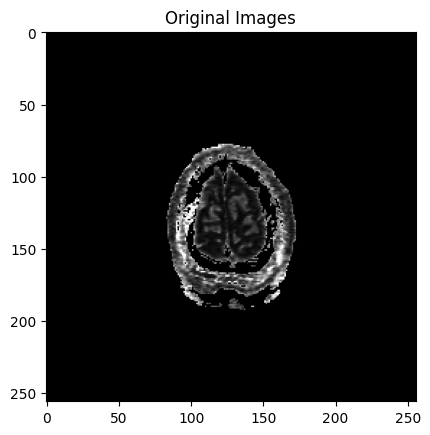

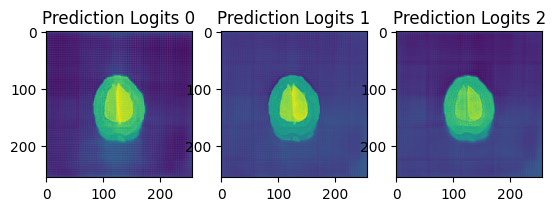

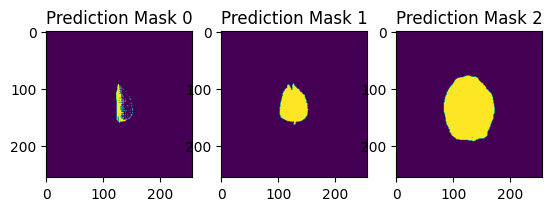

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


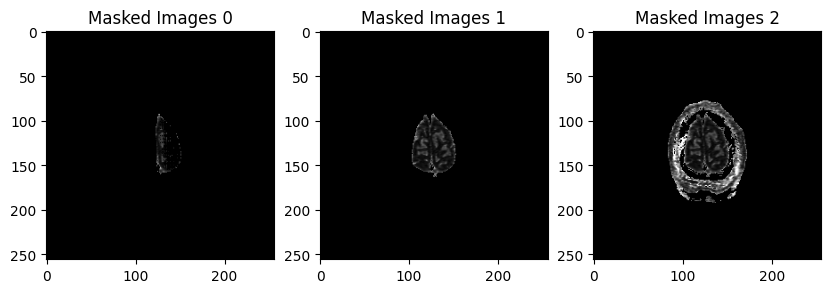

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 52.


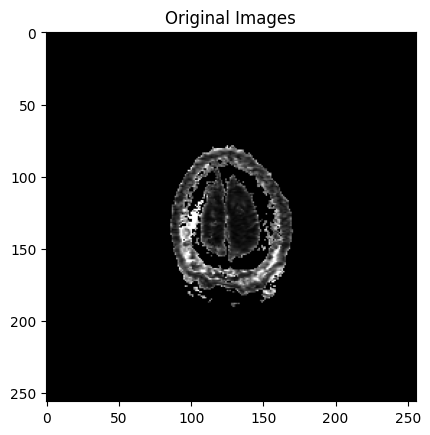

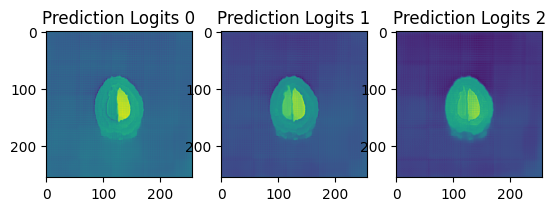

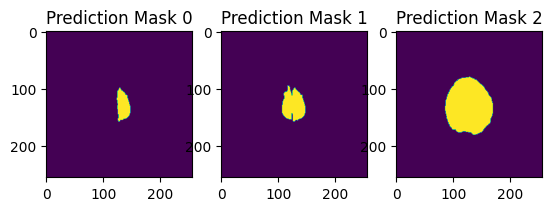

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


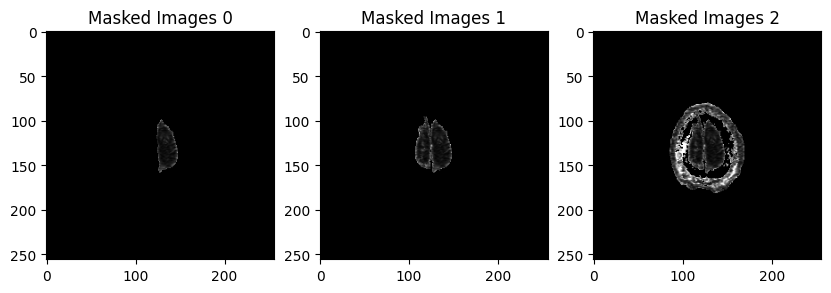

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 53.


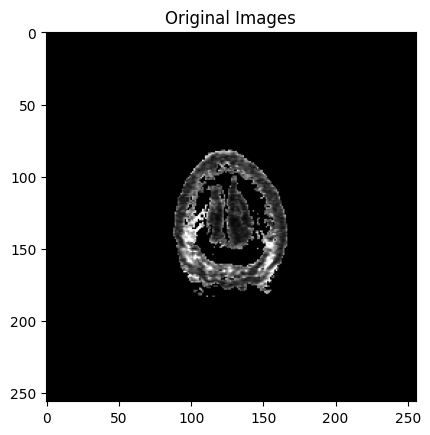

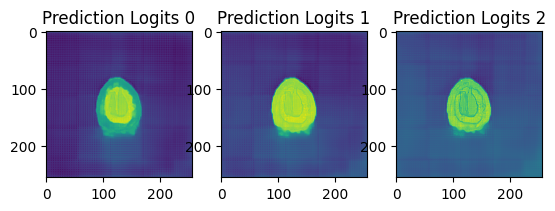

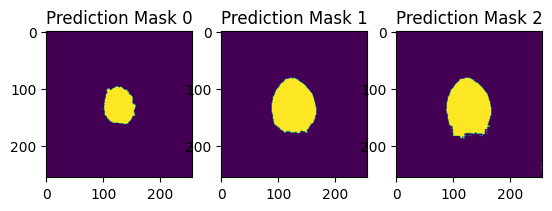

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


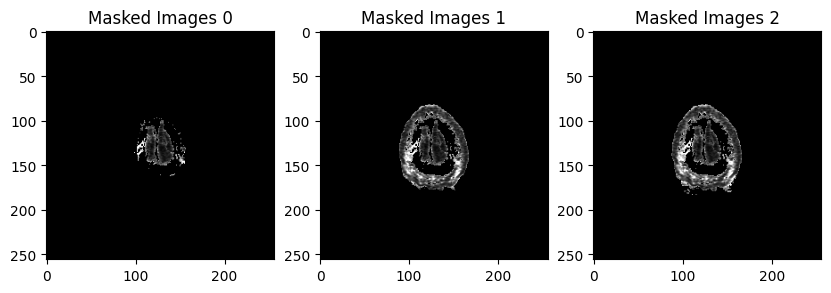

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 54.


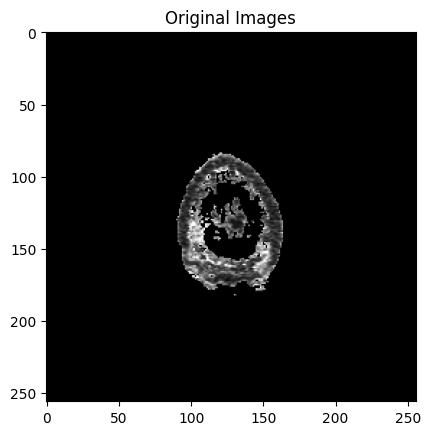

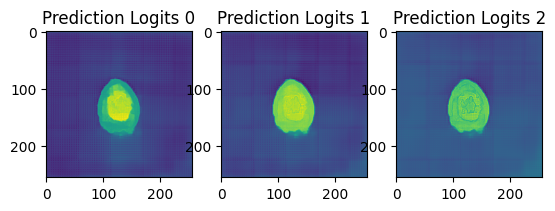

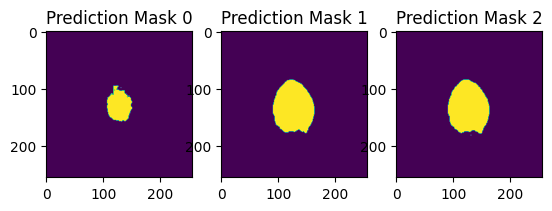

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


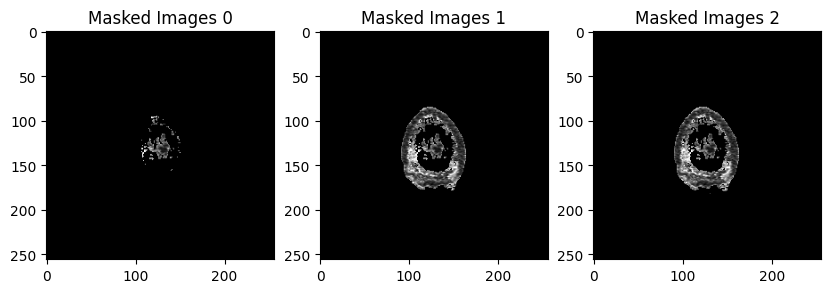

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 55.


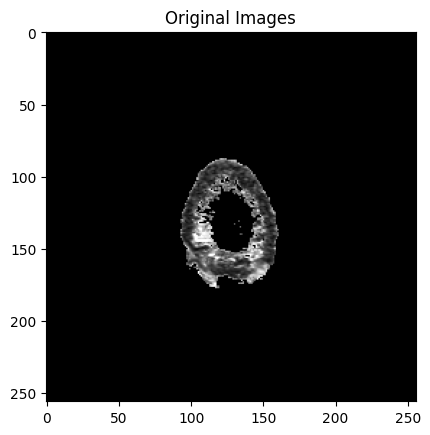

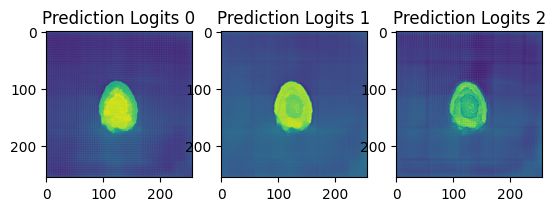

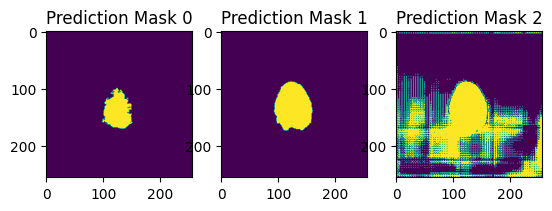

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


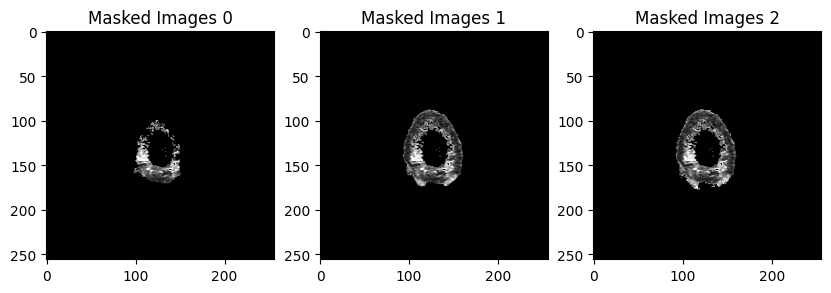

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 56.


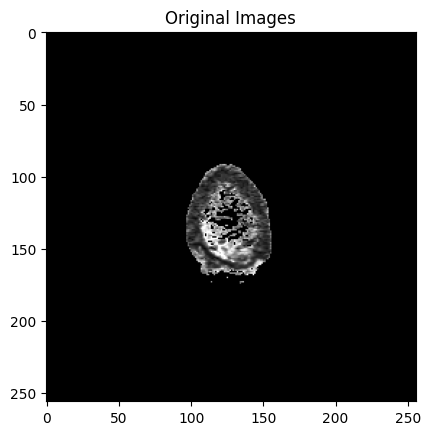

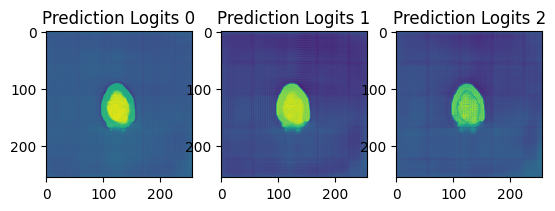

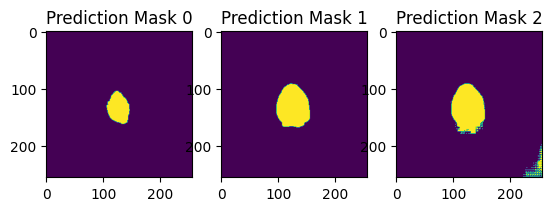

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


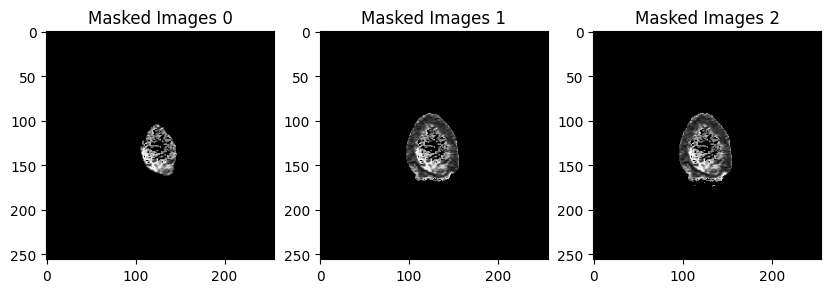

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Selected slicess are removed your dataset.
slice number of the images is 57.


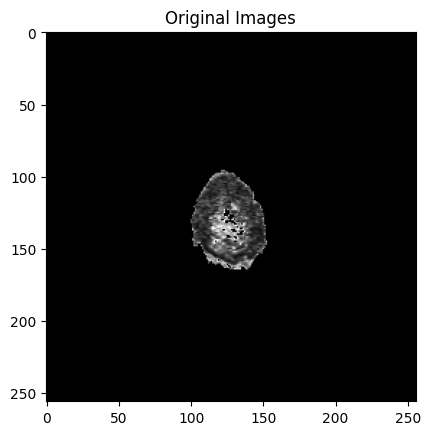

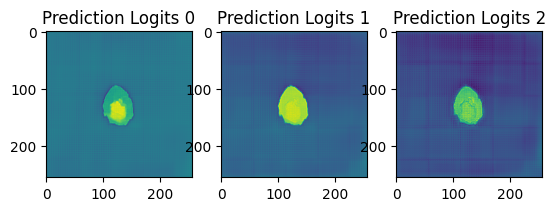

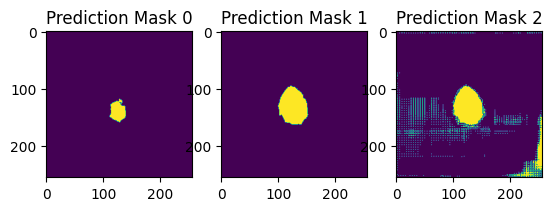

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


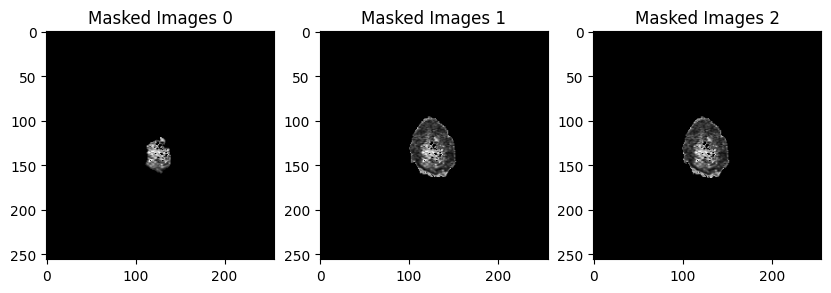

Selected slicess are removed your dataset.
###############################################################
Only you can write 0 or 1


UnboundLocalError: cannot access local variable 'result' where it is not associated with a value

In [19]:
masked_vol_images_68 = volumetric_segmentation_sam(vol_images_68, mask_plot=True, logits_plot=True, ref_point=0)

In [364]:
m0, m1, m2, m3 = masked_vol_images_68.shape
# Add a slider that starts with 0 and ends at the number of
# slices along the axial plane, n0=99.
@widgets.interact(axial_slice=(0,m0-1))
# Define the function that shows the images of the specified slice number.
# It starts with the 10th slice. And you can scroll over any slice
# using the slider.

def axial_slicer(axial_slice=10):
  
  # Show the image of the specified slice number in 'gray' color-map
  # and axial aspect ratio
  
  plt.imshow(masked_vol_images_68[axial_slice,:,:,1])
  #plt.imshow(mosaic_pictures_vol[axial_slice,:,:], cmap='hot')
  #plt.imshow(mosaic_pictures_vol[axial_slice,:,:], cmap='RdBu')

  # Don't show the axis
  plt.axis('off')
  plt.title("Mosic Pictures")

interactive(children=(IntSlider(value=10, description='axial_slice', max=31), Output()), _dom_classes=('widget…

In [351]:
masked_vol_images_68.shape

(32, 256, 256, 3)

In [352]:
rev_masked_vol_images_68 = []

for i in range(len(masked_vol_images_68)):
    rev_masked_vol_images_68.append(masked_vol_images_68[len(masked_vol_images_68)-i-1,:,:,:])

rev_masked_vol_images_68 = np.array(rev_masked_vol_images_68)

rev_masked_vol_images_68.shape

(32, 256, 256, 3)

In [371]:
np.save("/Applications/tez/Final_Dataset/FA_vol_dataset/clear_segmented_dataset_test/CN_masked_vol_images_68", masked_vol_images_68)

In [354]:
m0, m1, m2, m3 = rev_masked_vol_images_68.shape
# Add a slider that starts with 0 and ends at the number of
# slices along the axial plane, n0=99.
@widgets.interact(axial_slice=(0,m0-1))
# Define the function that shows the images of the specified slice number.
# It starts with the 10th slice. And you can scroll over any slice
# using the slider.

def axial_slicer(axial_slice=10):
  
  # Show the image of the specified slice number in 'gray' color-map
  # and axial aspect ratio
  
  plt.imshow(rev_masked_vol_images_68[axial_slice,:,:,1])
  #plt.imshow(mosaic_pictures_vol[axial_slice,:,:], cmap='hot')
  #plt.imshow(mosaic_pictures_vol[axial_slice,:,:], cmap='RdBu')

  # Don't show the axis
  plt.axis('off')
  plt.title("Mosic Pictures")

interactive(children=(IntSlider(value=10, description='axial_slice', max=31), Output()), _dom_classes=('widget…

## AD

In [67]:
m0, m1, m2, m3 = vol_images_2.shape
# Add a slider that starts with 0 and ends at the number of
# slices along the axial plane, n0=99.
@widgets.interact(axial_slice=(0,m0-1))
# Define the function that shows the images of the specified slice number.
# It starts with the 10th slice. And you can scroll over any slice
# using the slider.

def axial_slicer(axial_slice=18):
  # Show the image of the specified slice number in 'gray' color-map
  # and axial aspect ratio
  
  plt.imshow(vol_images_2[axial_slice,:,:,:])
  #plt.imshow(mosaic_pictures_vol[axial_slice,:,:], cmap='hot')
  #plt.imshow(mosaic_pictures_vol[axial_slice,:,:], cmap='RdBu')

  # Don't show the axis
  plt.axis('off')
  plt.title("AD Volumetic Pictures")

interactive(children=(IntSlider(value=18, description='axial_slice', max=57), Output()), _dom_classes=('widget…

In [68]:
sam_ex_ad_vol_img_path = "/Applications/tez/Final_Dataset/FA_vol_dataset/clear_segmented_dataset/AD_masked_vol_images_2.npy"
ad_sam_vol_2 = np.load(sam_ex_ad_vol_img_path)

m0, m1, m2, m3 = ad_sam_vol_2.shape
# Add a slider that starts with 0 and ends at the number of
# slices along the axial plane, n0=99.
@widgets.interact(axial_slice=(0,m0-1))
# Define the function that shows the images of the specified slice number.
# It starts with the 10th slice. And you can scroll over any slice
# using the slider.

def axial_slicer(axial_slice=18):
  # Show the image of the specified slice number in 'gray' color-map
  # and axial aspect ratio
  
  plt.imshow(ad_sam_vol_2[axial_slice,:,:,:])
  #plt.imshow(mosaic_pictures_vol[axial_slice,:,:], cmap='hot')
  #plt.imshow(mosaic_pictures_vol[axial_slice,:,:], cmap='RdBu')

  # Don't show the axis
  plt.axis('off')
  plt.title("AD Segmented Volumetic Pictures")

interactive(children=(IntSlider(value=18, description='axial_slice', max=31), Output()), _dom_classes=('widget…

In [89]:
import cv2

image = ad_sam_vol_2[24,:,:,:] * 255

# Convert the image to CV_8U (8-bit unsigned)
image_8u = cv2.convertScaleAbs(image, alpha=(255.0/image.max()))

#lab = cv2.cvtColor(images, cv2.COLOR_BGR2LAB)
lab = cv2.cvtColor(image_8u, cv2.COLOR_BGR2LAB)
l = lab[:,:,0]
a = lab[:,:,1]
b = lab[:,:,2]
            
            #Geleneksel equalazation yapalım.
equalized = cv2.equalizeHist(l)
            
            #Kanalları birleştirelim.
lab_img1_result = cv2.merge((equalized,a,b))
            
            #Lab formatımızı eski haline bgr haline dönüştürelim
hist_eq_img = cv2.cvtColor(lab_img1_result, cv2.COLOR_LAB2BGR)
hist_eq_img = hist_eq_img/255

Text(0.5, 1.0, 'Segmented Images of FA for AD')

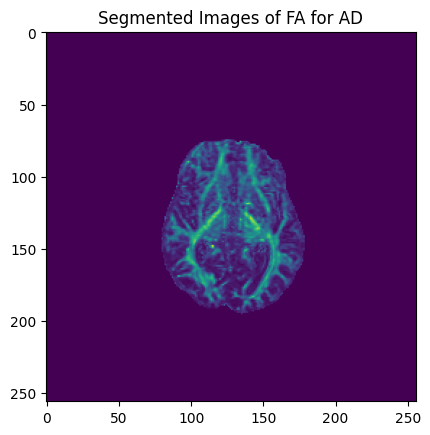

In [108]:
plt.imshow(ad_sam_vol_2[24,:,:,1])
plt.title("Segmented Images of FA for AD")

Text(0.5, 1.0, 'Equalized Histogram FA Images for AD')

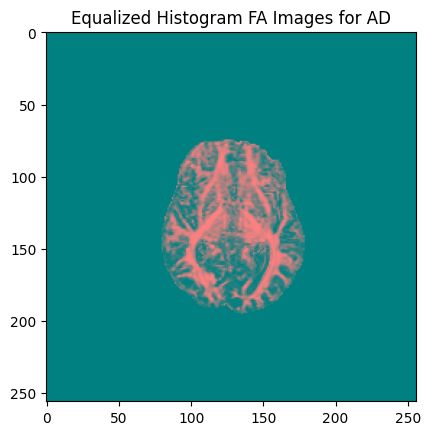

In [104]:
plt.imshow(lab_img1_result)
plt.title("Equalized Histogram FA Images for AD")

Text(0.5, 1.0, 'Clahe FA Image Results for AD')

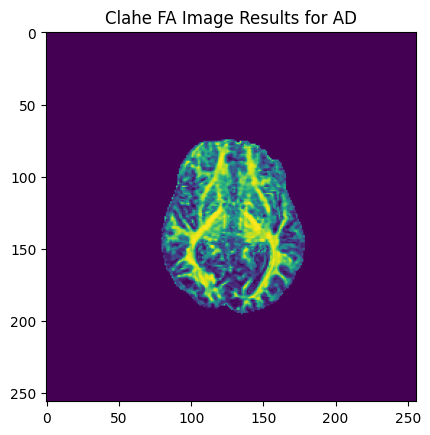

In [107]:
plt.imshow(hist_eq_img[:,:,1])
plt.title("Clahe FA Image Results for AD")

## CN

In [65]:
m0, m1, m2, m3 = vol_images_102.shape
# Add a slider that starts with 0 and ends at the number of
# slices along the axial plane, n0=99.
@widgets.interact(axial_slice=(0,m0-1))
# Define the function that shows the images of the specified slice number.
# It starts with the 10th slice. And you can scroll over any slice
# using the slider.

def axial_slicer(axial_slice=18):
  # Show the image of the specified slice number in 'gray' color-map
  # and axial aspect ratio
  
  plt.imshow(vol_images_102[axial_slice,:,:,:])
  #plt.imshow(mosaic_pictures_vol[axial_slice,:,:], cmap='hot')
  #plt.imshow(mosaic_pictures_vol[axial_slice,:,:], cmap='RdBu')

  # Don't show the axis
  plt.axis('off')
  plt.title("CN Volumetic Pictures")

interactive(children=(IntSlider(value=18, description='axial_slice', max=57), Output()), _dom_classes=('widget…

In [109]:
sam_ex_cn_vol_img_path = "/Applications/tez/Final_Dataset/FA_vol_dataset/clear_segmented_dataset/CN_masked_vol_images_102.npy"
cn_sam_vol_102 = np.load(sam_ex_cn_vol_img_path)

m0, m1, m2, m3 = cn_sam_vol_102.shape
# Add a slider that starts with 0 and ends at the number of
# slices along the axial plane, n0=99.
@widgets.interact(axial_slice=(0,m0-1))
# Define the function that shows the images of the specified slice number.
# It starts with the 10th slice. And you can scroll over any slice
# using the slider.

def axial_slicer(axial_slice=18):
  # Show the image of the specified slice number in 'gray' color-map
  # and axial aspect ratio
  
  plt.imshow(cn_sam_vol_102[axial_slice,:,:,:])
  #plt.imshow(mosaic_pictures_vol[axial_slice,:,:], cmap='hot')
  #plt.imshow(mosaic_pictures_vol[axial_slice,:,:], cmap='RdBu')

  # Don't show the axis
  plt.axis('off')
  plt.title("CN Segmented Volumetic Pictures")

interactive(children=(IntSlider(value=18, description='axial_slice', max=31), Output()), _dom_classes=('widget…

In [117]:
import cv2

image = cn_sam_vol_102[15,:,:,:] * 255

# Convert the image to CV_8U (8-bit unsigned)
image_8u = cv2.convertScaleAbs(image, alpha=(255.0/image.max()))

#lab = cv2.cvtColor(images, cv2.COLOR_BGR2LAB)
lab = cv2.cvtColor(image_8u, cv2.COLOR_BGR2LAB)
l = lab[:,:,0]
a = lab[:,:,1]
b = lab[:,:,2]
            
            #Geleneksel equalazation yapalım.
equalized = cv2.equalizeHist(l)
            
            #Kanalları birleştirelim.
lab_img1_result = cv2.merge((equalized,a,b))
            
            #Lab formatımızı eski haline bgr haline dönüştürelim
hist_eq_img = cv2.cvtColor(lab_img1_result, cv2.COLOR_LAB2BGR)
hist_eq_img = hist_eq_img/255

Text(0.5, 1.0, 'Segmented Images of FA for CN')

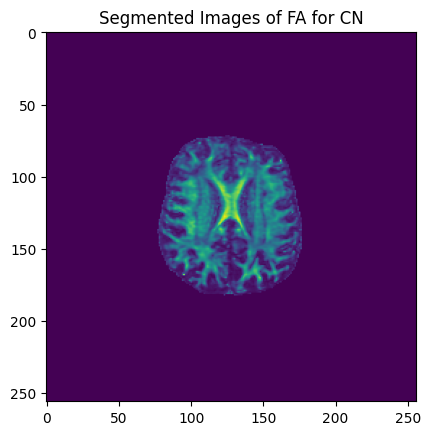

In [127]:
plt.imshow(cn_sam_vol_102[15,:,:,1])
plt.title("Segmented Images of FA for CN")

Text(0.5, 1.0, 'Equalized Histogram FA Images for CN')

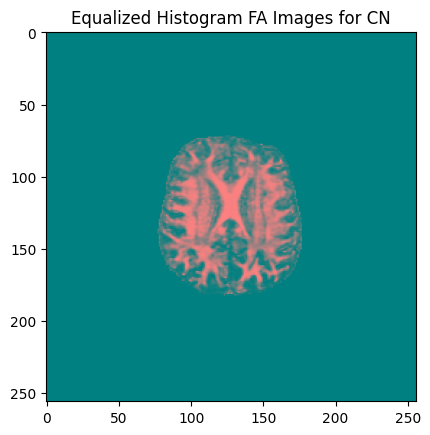

In [125]:
plt.imshow(lab_img1_result)
plt.title("Equalized Histogram FA Images for CN")

Text(0.5, 1.0, 'Clahe FA Image Results for CN')

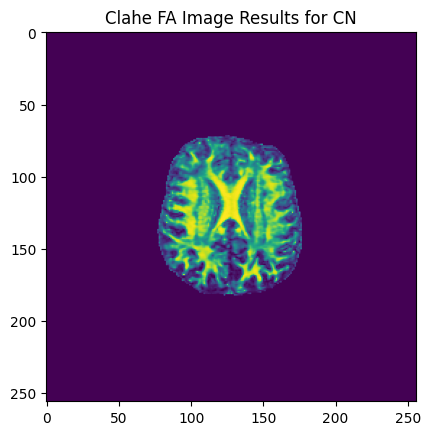

In [128]:
plt.imshow(hist_eq_img[:,:,1])
plt.title("Clahe FA Image Results for CN")

## MCI

In [142]:
m0, m1, m2, m3 = vol_images_301.shape
# Add a slider that starts with 0 and ends at the number of
# slices along the axial plane, n0=99.
@widgets.interact(axial_slice=(0,m0-1))
# Define the function that shows the images of the specified slice number.
# It starts with the 10th slice. And you can scroll over any slice
# using the slider.

def axial_slicer(axial_slice=18):
  # Show the image of the specified slice number in 'gray' color-map
  # and axial aspect ratio
  
  plt.imshow(vol_images_301[axial_slice,:,:,:])
  #plt.imshow(mosaic_pictures_vol[axial_slice,:,:], cmap='hot')
  #plt.imshow(mosaic_pictures_vol[axial_slice,:,:], cmap='RdBu')

  # Don't show the axis
  plt.axis('off')
  plt.title("MCI Volumetic Pictures")

interactive(children=(IntSlider(value=18, description='axial_slice', max=57), Output()), _dom_classes=('widget…

In [143]:
sam_ex_mci_vol_img_path = "/Applications/tez/Final_Dataset/FA_vol_dataset/clear_segmented_dataset/MCI_masked_vol_images_301.npy"
mci_sam_vol_301 = np.load(sam_ex_mci_vol_img_path)

m0, m1, m2, m3 = mci_sam_vol_301.shape
# Add a slider that starts with 0 and ends at the number of
# slices along the axial plane, n0=99.
@widgets.interact(axial_slice=(0,m0-1))
# Define the function that shows the images of the specified slice number.
# It starts with the 10th slice. And you can scroll over any slice
# using the slider.

def axial_slicer(axial_slice=18):
  # Show the image of the specified slice number in 'gray' color-map
  # and axial aspect ratio
  
  plt.imshow(mci_sam_vol_301[axial_slice,:,:,:])
  #plt.imshow(mosaic_pictures_vol[axial_slice,:,:], cmap='hot')
  #plt.imshow(mosaic_pictures_vol[axial_slice,:,:], cmap='RdBu')

  # Don't show the axis
  plt.axis('off')
  plt.title("MCI Segmented Volumetic Pictures")

interactive(children=(IntSlider(value=18, description='axial_slice', max=31), Output()), _dom_classes=('widget…

In [146]:
import cv2

image = mci_sam_vol_301[15,:,:,:] * 255

# Convert the image to CV_8U (8-bit unsigned)
image_8u = cv2.convertScaleAbs(image, alpha=(255.0/image.max()))

#lab = cv2.cvtColor(images, cv2.COLOR_BGR2LAB)
lab = cv2.cvtColor(image_8u, cv2.COLOR_BGR2LAB)
l = lab[:,:,0]
a = lab[:,:,1]
b = lab[:,:,2]
            
            #Geleneksel equalazation yapalım.
equalized = cv2.equalizeHist(l)
            
            #Kanalları birleştirelim.
lab_img1_result = cv2.merge((equalized,a,b))
            
            #Lab formatımızı eski haline bgr haline dönüştürelim
hist_eq_img = cv2.cvtColor(lab_img1_result, cv2.COLOR_LAB2BGR)
hist_eq_img = hist_eq_img/255

Text(0.5, 1.0, 'Segmented Images of FA for MCI')

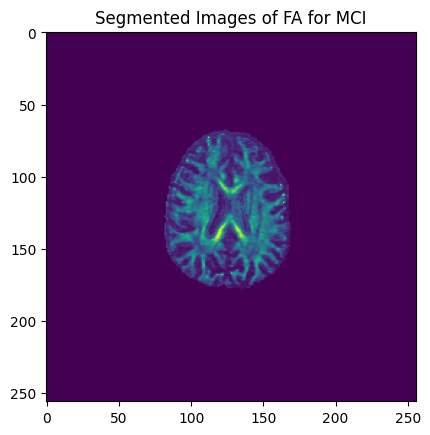

In [152]:
plt.imshow(mci_sam_vol_301[15,:,:,1])
plt.title("Segmented Images of FA for MCI")

Text(0.5, 1.0, 'Equalized Histogram FA Images for MCI')

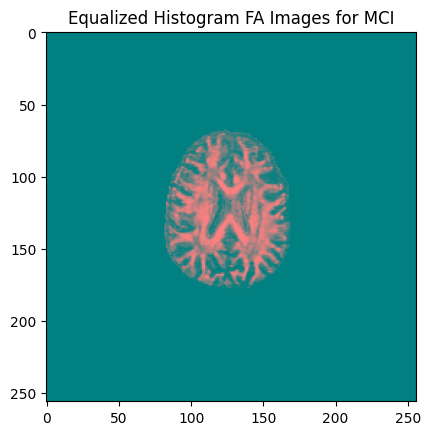

In [148]:
plt.imshow(lab_img1_result)
plt.title("Equalized Histogram FA Images for MCI")

Text(0.5, 1.0, 'Clahe FA Image Results for MCI')

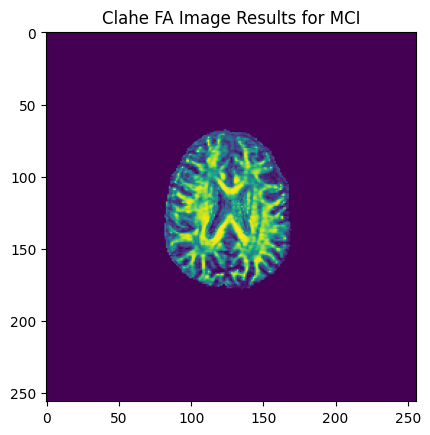

In [153]:
plt.imshow(hist_eq_img[:,:,1])
plt.title("Clahe FA Image Results for MCI")

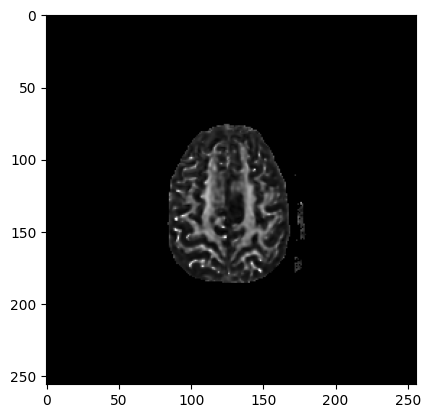

In [365]:
layer = 6
slice_img = masked_vol_images_10[layer,:,:,:] 
plt.imshow(slice_img)

In [366]:

image_for_mask = (slice_img * 255).round().astype(np.uint8) # 8 bit image type is import an to predict to desired masking

predictor.set_image(image_for_mask)

input_point = np.array([[120, 155]])
input_label = np.array([1])

masks, scores, logits = predictor.predict(
            point_coords=input_point,
            point_labels=input_label,
            multimask_output=True,)    

        
masked_image = np.ones(slice_img.shape)
masked_image.shape
masked_image[:,:,0] = slice_img[:,:,0] * masks[0,:,:] 
masked_image[:,:,1] = slice_img[:,:,1] * masks[0,:,:] 
masked_image[:,:,2] = slice_img[:,:,2] * masks[0,:,:] 

masked_image1 = np.ones(slice_img.shape)
masked_image1.shape
masked_image1[:,:,0] = slice_img[:,:,0] * masks[1,:,:] 
masked_image1[:,:,1] = slice_img[:,:,1] * masks[1,:,:] 
masked_image1[:,:,2] = slice_img[:,:,2] * masks[1,:,:]

masked_image2 = np.ones(slice_img.shape)
masked_image2.shape
masked_image2[:,:,0] = slice_img[:,:,0] * masks[2,:,:]
masked_image2[:,:,1] = slice_img[:,:,1] * masks[2,:,:] 
masked_image2[:,:,2] = slice_img[:,:,2] * masks[2,:,:] 

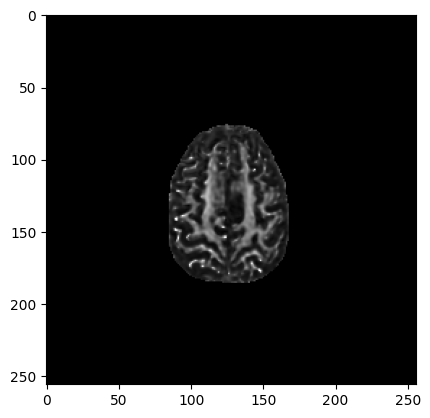

In [367]:
plt.imshow(masked_image1)

In [369]:
masked_vol_images_10[layer,:,:,:]  =  masked_image1

In [ ]:
def volumetric_segmentation_sam(vol_images, mask_plot, logits_plot, ref_point=0):
    num_selected_slices = 0
    masked_vol_images = []

    print("In this process, segmented anything model are used to segment and to get rid of the noise from the images.")


    for slice_num in range(len(vol_images)-ref_point):

        
        slice_num = slice_num + ref_point

        plt.close()
        # Vol data should be np.array in this function
        print(f"slice number of the images is {slice_num}.")

        slice_img = vol_images[slice_num,:,:,:]
        plt.imshow(slice_img)
        plt.title("Original Images")
        plt.show()


        image_for_mask = (slice_img * 255).round().astype(np.uint8) # 8 bit image type is import an to predict to desired masking

        predictor.set_image(image_for_mask)

        input_point = np.array([[128, 130]])
        input_label = np.array([1])

        masks, scores, logits = predictor.predict(
            point_coords=input_point,
            point_labels=input_label,
            multimask_output=True,)
        

        if logits_plot == True:
            plt.subplot(1,3,1)
            plt.imshow(logits[0,:,:])
            plt.subplot(1,3,2)
            plt.imshow(logits[1,:,:])
            plt.subplot(1,3,3)
            plt.imshow(logits[2,:,:])
            plt.show()


        if mask_plot == True:
            plt.subplot(1,3,1)
            plt.imshow(masks[0,:,:]) # True or False values are  determined
            plt.subplot(1,3,2)
            plt.imshow(masks[1,:,:])
            plt.subplot(1,3,3)
            plt.imshow(masks[2,:,:])
            plt.show()

        
        masked_image = np.ones(slice_img.shape)
        masked_image.shape
        masked_image[:,:,0] = slice_img[:,:,0] * masks[0,:,:] 
        masked_image[:,:,1] = slice_img[:,:,1] * masks[0,:,:] 
        masked_image[:,:,2] = slice_img[:,:,2] * masks[0,:,:] 

        masked_image1 = np.ones(slice_img.shape)
        masked_image1.shape
        masked_image1[:,:,0] = slice_img[:,:,0] * masks[1,:,:] 
        masked_image1[:,:,1] = slice_img[:,:,1] * masks[1,:,:] 
        masked_image1[:,:,2] = slice_img[:,:,2] * masks[1,:,:]

        masked_image2 = np.ones(slice_img.shape)
        masked_image2.shape
        masked_image2[:,:,0] = slice_img[:,:,0] * masks[2,:,:]
        masked_image2[:,:,1] = slice_img[:,:,1] * masks[2,:,:] 
        masked_image2[:,:,2] = slice_img[:,:,2] * masks[2,:,:] 


        plt.figure(figsize=(10,10))
        plt.subplot(1,3,1)
        plt.imshow(masked_image[:,:,:]) # True or False values are  determined
        plt.title("0")
        plt.subplot(1,3,2)
        plt.imshow(masked_image1[:,:,:])
        plt.title("1")
        plt.subplot(1,3,3)
        plt.imshow(masked_image2[:,:,:])
        plt.title("2")
        plt.show()

        
        process = True
        while process == True:
            okey = input("Do you want this slice to be included for your new dataset? [y/n]")
            if okey == "y":

                num_selected_slices = 1 + num_selected_slices
                
                condition = True
                while condition:
                    better = input("Whic msked images are better ?")
                    
                    if better == "0":
                        masked_vol_images.append(masked_image)
                        condition = False
                    elif better == "1":
                        masked_vol_images.append(masked_image1)
                        condition = False
                    elif better == "2":
                        masked_vol_images.append(masked_image2)
                        condition = False
                    else:
                        print("Hacı Yanlış Sayı Girdin Tekrar Dene")
                        condition = True 

                print(f"Number of selected slices is {num_selected_slices}")
                process = False
            elif okey == "n":
                print("Selected slicess are removed your dataset.")
                process = False
            else:
                print("Write again your answer with only using y or n key for your process")

    
    print("###############################################################")

    return np.array(masked_vol_images)